<a href="https://colab.research.google.com/github/adt281/missile-parts-segmentation-and-measurement-Computer-Vision-Model/blob/main/notebooks/computer_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**AUTO OBJECT DETECTION AND PART MEASUREMENT**

1. Detection of Object
2. Detection of Parts
3. Measurement of each part
   
   ( Nose - Radius,
     
     Body, Tail, Fin, Wing - All coordinate distances)

# DETECTRON2 MODEL

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.chdir('/content/drive/MyDrive/10DATA')


In [ ]:
!git clone https://github.com/facebookresearch/detectron2.git

fatal: destination path 'detectron2' already exists and is not an empty directory.


In [ ]:
os.chdir('/content/drive/MyDrive/10DATA/detectron2')
!pip install --upgrade pip setuptools



  Using cached pip-24.2-py3-none-any.whl.metadata (3.6 kB)
  Using cached setuptools-72.1.0-py3-none-any.whl.metadata (6.6 kB)
Using cached pip-24.2-py3-none-any.whl (1.8 MB)
Using cached setuptools-72.1.0-py3-none-any.whl (2.3 MB)
  Attempting uninstall: setuptools
    Found existing installation: setuptools 71.0.4
    Uninstalling setuptools-71.0.4:
      Successfully uninstalled setuptools-71.0.4
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
!python -m pip install pyyaml

In [ ]:
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
dist = distutils.core.run_setup("/content/drive/MyDrive/10DATA/detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}


Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 65.9 MB/s eta 0:00:00
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61399 sha256=34d73e078fac0b84c4d3d126204dce26f41e1aed268ee9200d8324440dd66542
  Stored in directory: /root/.cache/pip/wheels/01/c0/af/77c1cf53a1be9e42a52b48e5af2169d40ec2e89f7362489dd0
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144554 sha256=7287a49cfcbeb44aeaaf03c2754abeed9961c018b3e84a8ae047bca6ad88cd93
  Stored in directory: /root/.cache/pip/wheels/12/93/dd/1f6a127edc45659556564c5730f6d4e300888f4bca2d4c5a88
Successfully built fvcore antlr4-python3-runtime


In [ ]:
sys.path.insert(0, os.path.abspath('/content/drive/MyDrive/10DATA/detectron2'))

In [ ]:
os.chdir('/content/drive/MyDrive/10DATA')
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Print Detectron2 version
print("detectron2:", detectron2.__version__ if hasattr(detectron2, '__version__') else "Unknown")

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Clear any existing datasets
DatasetCatalog.clear()
MetadataCatalog.clear()
import json

def remap_category_ids(annotation_file):
    with open(annotation_file, 'r') as f:
        coco_data = json.load(f)

    # Extract the categories
    categories = coco_data['categories']

    # Create a mapping from original ID to new sequential ID
    original_to_new_id = {category['id']: idx + 1 for idx, category in enumerate(categories)}

    # Update category IDs
    for category in categories:
        category['id'] = original_to_new_id[category['id']]

    # Apply the mapping to annotations
    for annotation in coco_data['annotations']:
        annotation['category_id'] = original_to_new_id[annotation['category_id']]

    # Save the updated annotations back to the file
    with open(annotation_file, 'w') as f:
        json.dump(coco_data, f, indent=4)

# Path to your annotation file
annotation_file = '/content/drive/MyDrive/10DATA/Dataset/train/_annotations.coco.json'
remap_category_ids(annotation_file)

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/10DATA/Dataset/train/_annotations.coco.json", "/content/drive/MyDrive/10DATA/Dataset/train")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/10DATA/Dataset/valid/_annotations.coco.json", "/content/drive/MyDrive/10DATA/Dataset/valid")

In [ ]:
train_metadata = MetadataCatalog.get("my_dataset_train")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train")

[08/09 09:32:01 d2.data.datasets.coco]: Loaded 52 images in COCO format from /content/drive/MyDrive/10DATA/Dataset/train/_annotations.coco.json


In [ ]:
val_metadata = MetadataCatalog.get("my_dataset_val")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")

WARNING [08/09 09:32:02 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/09 09:32:02 d2.data.datasets.coco]: Loaded 20 images in COCO format from /content/drive/MyDrive/10DATA/Dataset/valid/_annotations.coco.json


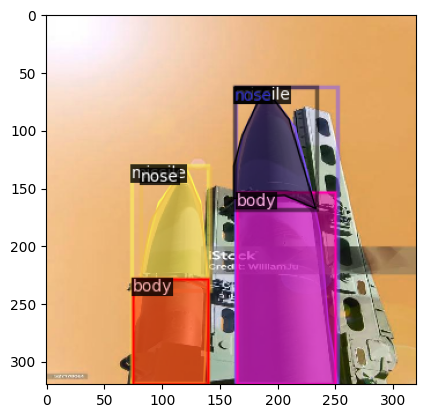

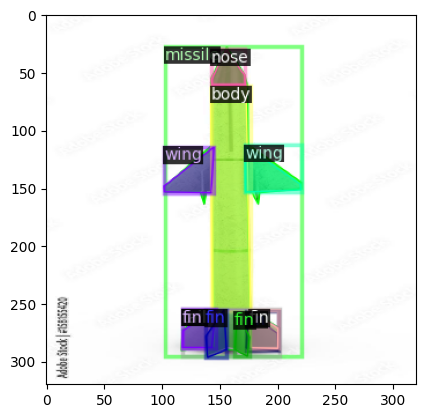

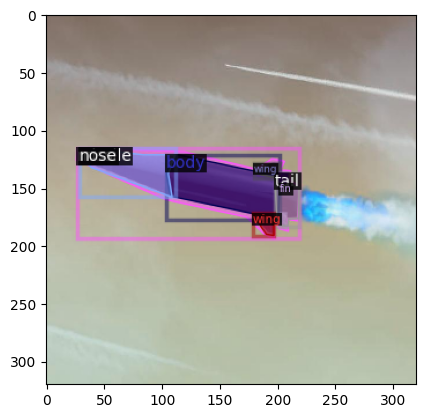

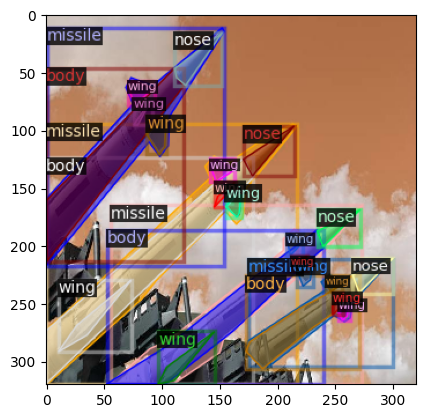

In [ ]:
from matplotlib import pyplot as plt


# Visualize some random samples
for d in random.sample(train_dataset_dicts, 4):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()



In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/10DATA/Detectron2_Models"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.MAX_ITER = 2000    # 1000 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7  # We have 6 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.
cfg.TEST.EVAL_PERIOD = 200  # Evaluate every 500 iterations
cfg.INPUT.MASK_FORMAT='bitmask'

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


In [ ]:
trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or

[08/09 09:32:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 140MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [ ]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [ ]:
trainer.train()

[08/06 12:38:15 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/06 12:38:22 d2.utils.events]:  eta: 0:11:12  iter: 19  total_loss: 4.581  loss_cls: 1.977  loss_box_reg: 0.8343  loss_mask: 0.6922  loss_rpn_cls: 0.9198  loss_rpn_loc: 0.102    time: 0.3350  last_time: 0.3421  data_time: 0.0318  last_data_time: 0.0096   lr: 1.9981e-05  max_mem: 2281M
[08/06 12:38:30 d2.utils.events]:  eta: 0:11:38  iter: 39  total_loss: 3.774  loss_cls: 1.581  loss_box_reg: 0.8835  loss_mask: 0.6838  loss_rpn_cls: 0.5296  loss_rpn_loc: 0.09658    time: 0.3697  last_time: 0.2846  data_time: 0.0341  last_data_time: 0.0121   lr: 3.9961e-05  max_mem: 2283M
[08/06 12:38:37 d2.utils.events]:  eta: 0:11:17  iter: 59  total_loss: 3.145  loss_cls: 1.17  loss_box_reg: 0.8927  loss_mask: 0.6723  loss_rpn_cls: 0.191  loss_rpn_loc: 0.08047    time: 0.3638  last_time: 0.3474  data_time: 0.0169  last_data_time: 0.0135   lr: 5.9941e-05  max_mem: 2283M
[08/06 12:38:45 d2.utils.events]:  eta: 0:11:46  iter: 79  total_loss: 2.693  loss_cls: 0.9534  loss_box_reg: 0.8603  loss_mask: 0.

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
import yaml
# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/10DATA/Detectron2_Models/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

In [ ]:
# ---------cpu -------------
import os
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg

# Set up the configuration
cfg = get_cfg()
cfg.merge_from_file("/content/drive/MyDrive/10DATA/Detectron2_Models/config.yaml")  # Provide the path to your config file
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2   # set a custom testing threshold

# Set the device to CPU explicitly (this step is crucial for running on CPU)
cfg.MODEL.DEVICE = "cpu"

# Create the predictor
predictor = DefaultPredictor(cfg)

[08/09 09:32:11 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/10DATA/Detectron2_Models/model_final.pth ...


In [ ]:
#---------gpu --------------#

# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[08/09 09:32:32 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/10DATA/Detectron2_Models/model_final.pth ...


In [ ]:
from detectron2.utils.visualizer import ColorMode

/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


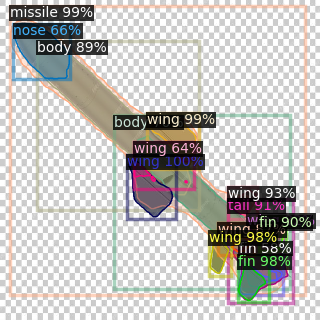

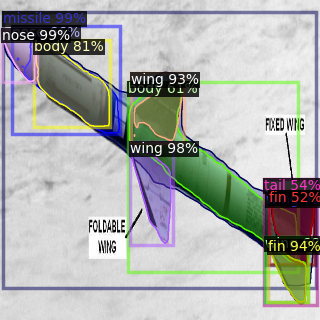

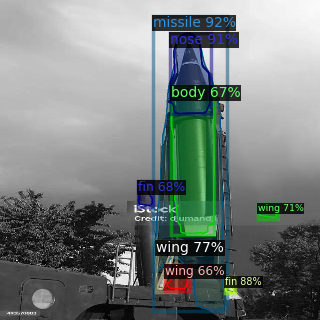

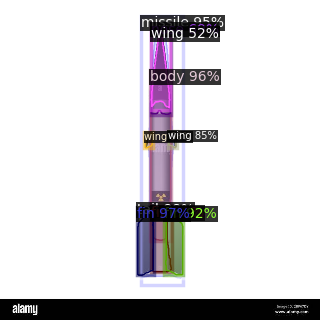

In [ ]:
for d in random.sample(val_dataset_dicts, 4):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog
import cv2
import numpy as np

# Load the validation dataset
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")

# Initialize the predictor with the trained model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)

# Lists to store ground truth and predictions
y_true = []
y_pred = []

# Iterate over the validation dataset
for data in val_dataset_dicts:
    img = cv2.imread(data["file_name"])
    outputs = predictor(img)

    # Extract the predicted class labels
    pred_classes = outputs["instances"].pred_classes.cpu().numpy()

    # Extract the ground truth class labels
    gt_classes = [anno['category_id'] for anno in data['annotations']]

    # Extend the lists with the current image's predictions and ground truths
    y_true.extend(gt_classes)
    y_pred.extend(pred_classes)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

WARNING [08/09 09:32:54 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/09 09:32:54 d2.data.datasets.coco]: Loaded 20 images in COCO format from /content/drive/MyDrive/10DATA/Dataset/valid/_annotations.coco.json
[08/09 09:32:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/10DATA/Detectron2_Models/model_final.pth ...


In [ ]:
# Lists to store ground truth and predictions
y_true = []
y_pred = []

# Perform inference on validation set with debugging print statements
for idx, data in enumerate(val_dataset_dicts):
    img = cv2.imread(data["file_name"])
    outputs = predictor(img)

    # Extract the predicted class labels
    pred_classes = outputs["instances"].pred_classes.cpu().numpy()

    # Extract the ground truth class labels
    gt_classes = [anno['category_id'] for anno in data['annotations']]

    # Debugging print statements
    print(f"Image {idx + 1}:")
    print(f"  Ground Truth Classes: {gt_classes}")
    print(f"  Predicted Classes: {pred_classes}")

    # Extend the lists with the current image's predictions and ground truths
    y_true.extend(gt_classes)
    y_pred.extend(pred_classes)

# Debugging print statements to check final lengths
print(f"Total Ground Truth Samples: {len(y_true)}")
print(f"Total Predicted Samples: {len(y_pred)}")

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Check if lengths are equal
if len(y_true) == len(y_pred):
    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Display confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.show()
else:
    print("Error: The number of ground truth samples and predicted samples do not match.")


Image 1:
  Ground Truth Classes: [3, 3, 3, 4, 3, 1, 1, 6, 4, 6, 1, 6, 4, 6, 6, 6, 5, 2, 4]
  Predicted Classes: [6 6 6 6 3 6 4 6 1 6 6 3 6 6 6 6]
Image 2:
  Ground Truth Classes: [3, 4, 1, 6, 6, 6, 5, 2, 2, 2]
  Predicted Classes: [6 6 6 3 1 2 6 6 5 6 4 2 6]
Image 3:
  Ground Truth Classes: [3, 1, 6, 6, 6, 5, 2, 2, 2, 4]
  Predicted Classes: [3 4 6 2 6 1 6 6 4 1 5 2]
Image 4:
  Ground Truth Classes: [3, 1, 6, 6, 6, 5, 6, 6, 6, 2, 2, 2, 4]
  Predicted Classes: [6 6 3 6 2 6 5 2 1 6 6 1 4 6 2]
Image 5:
  Ground Truth Classes: [3, 1, 6, 6, 6, 6, 6, 6, 5, 2, 2, 2, 4]
  Predicted Classes: [6 6 6 6 3 6 6 4 4 1]
Image 6:
  Ground Truth Classes: [3, 1, 6, 6, 6, 5, 2, 2, 2, 4]
  Predicted Classes: [6 6 4 6 3 2 2 1 6 2 6 6 6 5 6 6 2 1 2 1]
Image 7:
  Ground Truth Classes: [3, 1, 6, 6, 5, 2, 2, 4]
  Predicted Classes: [6 2 1 3 2 5 6 4 2 6]
Image 8:
  Ground Truth Classes: [3, 1, 6, 6, 6, 6, 5, 2, 2, 2, 2, 4]
  Predicted Classes: [6 6 6 2 6 5 3 4 6 2 1 6 6 6 6 6 6 1 6]
Image 9:
  Ground Truth Class

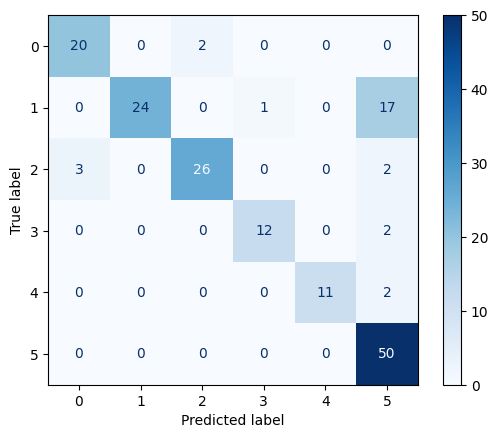

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from detectron2.structures import Boxes

# Function to calculate IoU
def compute_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x1g, y1g, x2g, y2g = box2

    xi1 = max(x1, x1g)
    yi1 = max(y1, y1g)
    xi2 = min(x2, x2g)
    yi2 = min(y2, y2g)
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)

    box1_area = (x2 - x1) * (y2 - y1)
    box2_area = (x2g - x1g) * (y2g - y1g)

    union_area = box1_area + box2_area - inter_area

    iou = inter_area / union_area

    return iou

# Function to match predictions to ground truths using IoU
def match_predictions(gt_boxes, pred_boxes, iou_threshold=0.5):
    matched_gt = []
    matched_pred = []

    for i, gt_box in enumerate(gt_boxes):
        best_iou = 0
        best_j = -1
        for j, pred_box in enumerate(pred_boxes):
            iou = compute_iou(gt_box, pred_box)
            if iou > best_iou:
                best_iou = iou
                best_j = j

        if best_iou > iou_threshold:
            matched_gt.append(i)
            matched_pred.append(best_j)

    return matched_gt, matched_pred

# Lists to store ground truth and predictions
y_true = []
y_pred = []

# Perform inference on validation set
for idx, data in enumerate(val_dataset_dicts):
    img = cv2.imread(data["file_name"])
    outputs = predictor(img)

    pred_classes = outputs["instances"].pred_classes.cpu().numpy()
    pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()

    gt_classes = [anno['category_id'] for anno in data['annotations']]
    gt_boxes = [anno['bbox'] for anno in data['annotations']]

    # Convert COCO format bbox to [x1, y1, x2, y2] format
    gt_boxes = np.array([[x, y, x+w, y+h] for x, y, w, h in gt_boxes])

    matched_gt, matched_pred = match_predictions(gt_boxes, pred_boxes)

    for i in matched_gt:
        y_true.append(gt_classes[i])

    for j in matched_pred:
        y_pred.append(pred_classes[j])

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.show()


In [ ]:
import numpy as np
from collections import defaultdict

# Function to calculate IoU
def compute_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x1g, y1g, x2g, y2g = box2

    xi1 = max(x1, x1g)
    yi1 = max(y1, y1g)
    xi2 = min(x2, x2g)
    yi2 = min(y2, y2g)
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)

    box1_area = (x2 - x1) * (y2 - y1)
    box2_area = (x2g - x1g) * (y2g - y1g)

    union_area = box1_area + box2_area - inter_area

    iou = inter_area / union_area

    return iou

# Function to match predictions to ground truths using IoU
def match_predictions(gt_boxes, pred_boxes, iou_threshold=0.5):
    matched_gt = []
    matched_pred = []

    for i, gt_box in enumerate(gt_boxes):
        best_iou = 0
        best_j = -1
        for j, pred_box in enumerate(pred_boxes):
            iou = compute_iou(gt_box, pred_box)
            if iou > best_iou:
                best_iou = iou
                best_j = j

        if best_iou > iou_threshold:
            matched_gt.append(i)
            matched_pred.append(best_j)

    return matched_gt, matched_pred

# Function to calculate precision and recall
def calculate_precision_recall(gt_classes, pred_classes, pred_scores, gt_boxes, pred_boxes, iou_threshold=0.5):
    tp = np.zeros(len(pred_classes))
    fp = np.zeros(len(pred_classes))

    matched_gt = set()

    for i in range(len(pred_classes)):
        pred_box = pred_boxes[i]
        best_iou = 0
        best_gt_idx = -1

        for j in range(len(gt_classes)):
            if j in matched_gt:
                continue

            gt_box = gt_boxes[j]
            iou = compute_iou(pred_box, gt_box)

            if iou > best_iou:
                best_iou = iou
                best_gt_idx = j

        if best_iou > iou_threshold and pred_classes[i] == gt_classes[best_gt_idx]:
            tp[i] = 1
            matched_gt.add(best_gt_idx)
        else:
            fp[i] = 1

    tp_cumsum = np.cumsum(tp)
    fp_cumsum = np.cumsum(fp)

    precision = tp_cumsum / (tp_cumsum + fp_cumsum)
    recall = tp_cumsum / len(gt_classes)

    return precision, recall

# Function to calculate mAP
def calculate_map(precisions, recalls):
    ap = 0
    for t in np.arange(0, 1.1, 0.1):
        p = np.max(precisions[recalls >= t]) if np.sum(recalls >= t) != 0 else 0
        ap += p / 11.0
    return ap


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score

# Store results for each class
all_precisions = defaultdict(list)
all_recalls = defaultdict(list)
all_aps = []

# Perform inference on validation set
for idx, data in enumerate(val_dataset_dicts):
    img = cv2.imread(data["file_name"])
    outputs = predictor(img)

    pred_classes = outputs["instances"].pred_classes.cpu().numpy()
    pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    pred_scores = outputs["instances"].scores.cpu().numpy()

    gt_classes = [anno['category_id'] for anno in data['annotations']]
    gt_boxes = [anno['bbox'] for anno in data['annotations']]

    # Convert COCO format bbox to [x1, y1, x2, y2] format
    gt_boxes = np.array([[x, y, x+w, y+h] for x, y, w, h in gt_boxes])

    precision, recall = calculate_precision_recall(gt_classes, pred_classes, pred_scores, gt_boxes, pred_boxes)

    for c in np.unique(gt_classes):
        idxs = np.where(pred_classes == c)
        if len(idxs[0]) > 0:
            p = precision[idxs]
            r = recall[idxs]
            all_precisions[c].extend(p)
            all_recalls[c].extend(r)

# Calculate mAP
for c in all_precisions.keys():
    precisions = np.array(all_precisions[c])
    recalls = np.array(all_recalls[c])
    ap = calculate_map(precisions, recalls)
    all_aps.append(ap)
    print(f"Class {c} AP: {ap:.4f}")

mAP = np.mean(all_aps)
print(f"mAP: {mAP:.4f}")


Class 1 AP: 0.8818
Class 3 AP: 0.5455
Class 4 AP: 1.0000
Class 6 AP: 0.9798
Class 2 AP: 0.9596
Class 5 AP: 0.9545
mAP: 0.8869


# PART DETECTION



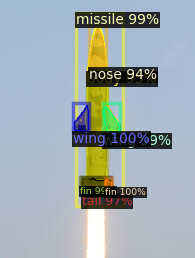

In [ ]:
new_im = cv2.imread("/content/drive/MyDrive/10DATA/images.jpeg")
outputs  = predictor(new_im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

cv2_imshow(out.get_image()[:, :, ::-1])

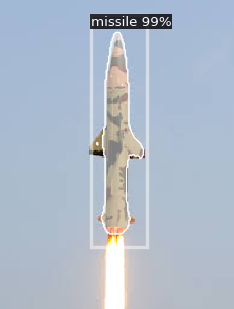

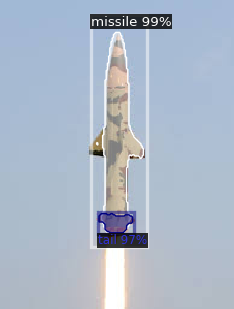

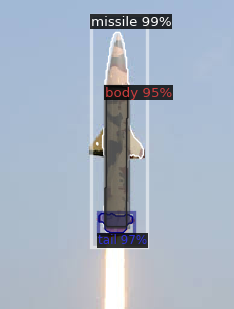

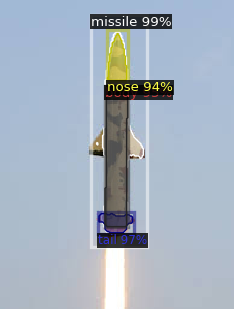

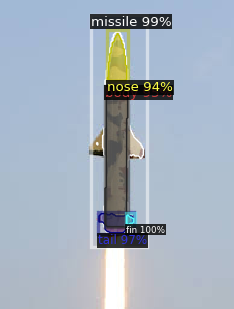

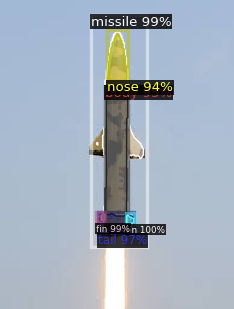

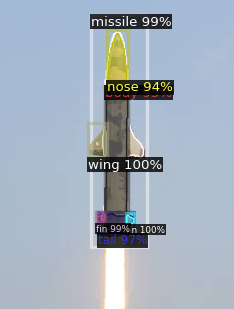

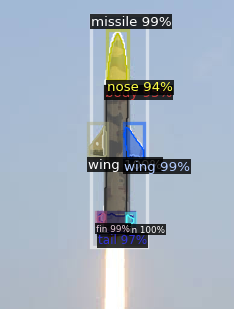

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer

# Load the image
image_path = "/content/drive/MyDrive/10DATA/images.jpeg"
new_im = cv2.imread(image_path)

# Check if the image was loaded successfully
if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize a dictionary to store the maximum instance for each class and lists for "fin" and "wing"
max_instances = {}
fin_instances = []
wing_instances = []

# Loop through each instance
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()

    class_name = train_metadata.thing_classes[pred_class]

    # Separate instances of "fin" and "wing"
    if class_name == "fin":
        fin_instances.append(instances[i:i+1])
    elif class_name == "wing":
        wing_instances.append(instances[i:i+1])
    else:
        # Check if we already have an instance for this class
        if pred_class in max_instances:
            # If current instance has a higher score, update it
            if score > max_instances[pred_class]['score']:
                max_instances[pred_class] = {
                    'instance': instances[i:i+1],
                    'score': score
                }
        else:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score
            }

# Visualize and display the maximum instance for each class (except "fin" and "wing")
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata, scale=1.2)

for key in max_instances:
    max_instance = max_instances[key]['instance']
    out = v.draw_instance_predictions(max_instance)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Visualize and display all instances of "fin"
for fin_instance in fin_instances:
    out = v.draw_instance_predictions(fin_instance)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Visualize and display all instances of "wing"
for wing_instance in wing_instances:
    out = v.draw_instance_predictions(wing_instance)
    cv2_imshow(out.get_image()[:, :, ::-1])


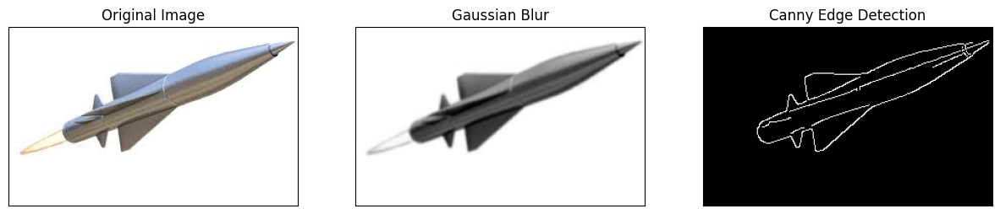

In [ ]:
import cv2
import matplotlib.pyplot as plt

def canny_edge_detection_with_blur(input_image_path):
    # Read the image
    img = cv2.imread(input_image_path)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # Adjust kernel size (5, 5) and sigma (0) as needed

    # Apply Canny edge detection
    edges = cv2.Canny(blurred, threshold1=100, threshold2=200)  # Adjust thresholds as needed

    # Display the original image, blurred image, and edges
    plt.figure(figsize=(15, 5))
    plt.subplot(131), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(blurred, cmap='gray')
    plt.title('Gaussian Blur'), plt.xticks([]), plt.yticks([])
    plt.subplot(133), plt.imshow(edges, cmap='gray')
    plt.title('Canny Edge Detection'), plt.xticks([]), plt.yticks([])
    plt.show()

# Example usage:
input_image_path = '/content/drive/MyDrive/10DATA/mis3.jpeg'
canny_edge_detection_with_blur(input_image_path)


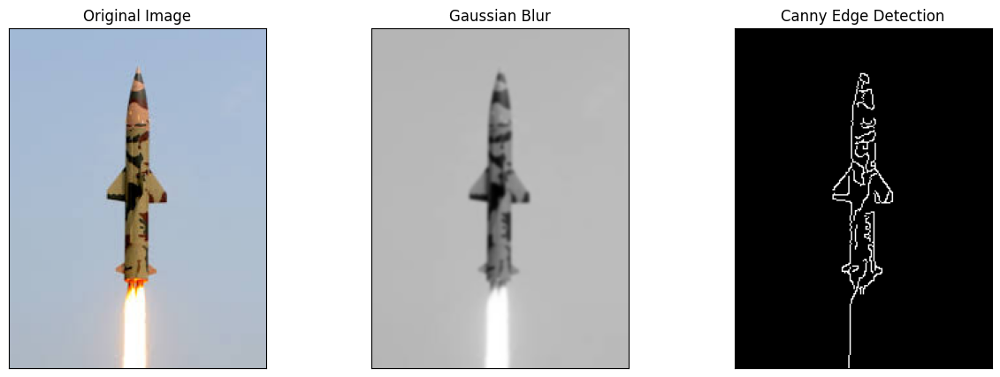

In [ ]:
import cv2
import matplotlib.pyplot as plt

def canny_edge_detection_with_blur(input_image_path):
    # Read the image
    img = cv2.imread(input_image_path)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # Adjust kernel size (5, 5) and sigma (0) as needed

    # Apply Canny edge detection
    edges = cv2.Canny(blurred, threshold1=100, threshold2=200)  # Adjust thresholds as needed

    # Display the original image, blurred image, and edges
    plt.figure(figsize=(15, 5))
    plt.subplot(131), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(blurred, cmap='gray')
    plt.title('Gaussian Blur'), plt.xticks([]), plt.yticks([])
    plt.subplot(133), plt.imshow(edges, cmap='gray')
    plt.title('Canny Edge Detection'), plt.xticks([]), plt.yticks([])
    plt.show()

# Example usage:
input_image_path = '/content/drive/MyDrive/10DATA/images.jpeg'
canny_edge_detection_with_blur(input_image_path)


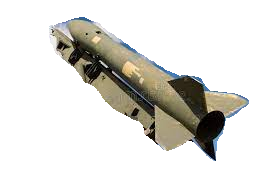

Saved masked image to: /content/drive/MyDrive/10DATA/masked_output.png


In [ ]:
# Load the image
image_path = "/content/drive/MyDrive/10DATA/image2s.jpeg"
image = cv2.imread(image_path)

# Run the predictor
outputs = predictor(image)

# Get the instances
instances = outputs["instances"].to("cpu")
masks = instances.pred_masks.numpy()  # [N, H, W]
num_masks = masks.shape[0]

# Create a blank image with an alpha channel
height, width, _ = image.shape
blank_image = np.zeros((height, width, 4), dtype=np.uint8)

# Process each mask
for i in range(num_masks):
    mask = masks[i]

    # Create an alpha channel based on the mask
    alpha_channel = (mask * 255).astype(np.uint8)

    # Create an RGBA image where the RGB channels are from the original image and the alpha channel is from the mask
    rgba_image = np.dstack((image, alpha_channel))

    # Use the mask to copy the RGBA image to the blank image
    blank_image[mask] = rgba_image[mask]

# Display the result
cv2_imshow(blank_image)
# Save the result to a file
output_path = "/content/drive/MyDrive/10DATA/masked_output.png"
cv2.imwrite(output_path, blank_image)
print(f"Saved masked image to: {output_path}")

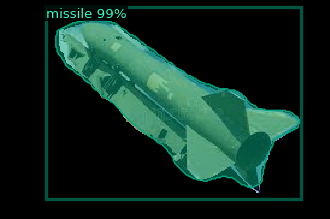

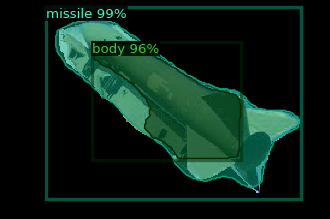

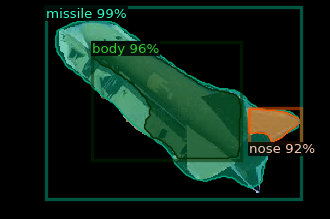

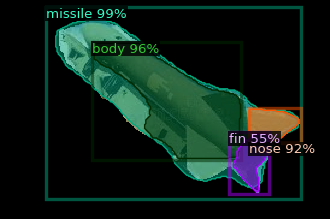

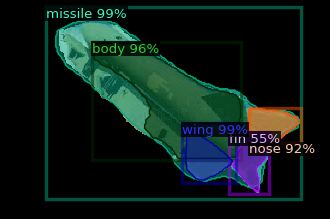

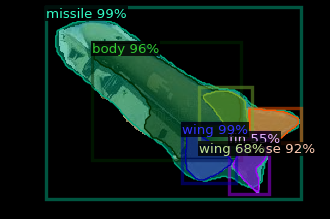

Saved masked image to: /content/drive/MyDrive/10DATA/masked_final.png


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer

# Load the image
image_path = "/content/drive/MyDrive/10DATA/masked_output.png"
new_im = cv2.imread(image_path)

# Check if the image was loaded successfully
if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize containers for storing images
output_images = []

# Initialize a dictionary to store the maximum instance for each class and lists for "fin" and "wing"
max_instances = {}
fin_instances = []
wing_instances = []

# Loop through each instance
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()

    class_name = train_metadata.thing_classes[pred_class]

    # Separate instances of "fin" and "wing"
    if class_name == "fin":
        fin_instances.append(instances[i:i+1])
    elif class_name == "wing":
        wing_instances.append(instances[i:i+1])
    else:
        # Check if we already have an instance for this class
        if pred_class in max_instances:
            # If current instance has a higher score, update it
            if score > max_instances[pred_class]['score']:
                max_instances[pred_class] = {
                    'instance': instances[i:i+1],
                    'score': score
                }
        else:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score
            }

# Visualize and store the maximum instance for each class (except "fin" and "wing")
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata, scale=1.2)

for key in max_instances:
    max_instance = max_instances[key]['instance']
    out = v.draw_instance_predictions(max_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

# Visualize and store all instances of "fin"
for fin_instance in fin_instances:
    out = v.draw_instance_predictions(fin_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

# Visualize and store all instances of "wing"
for wing_instance in wing_instances:
    out = v.draw_instance_predictions(wing_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

# Now output_images contains all the images as numpy arrays
# Example: To access the first image
first_image = output_images[0]
output_path = "/content/drive/MyDrive/10DATA/masked_final.png"
n = len(output_images)
cv2.imwrite(output_path, output_images[n-1])
print(f"Saved masked image to: {output_path}")

# CANNY EDGE DETECTION

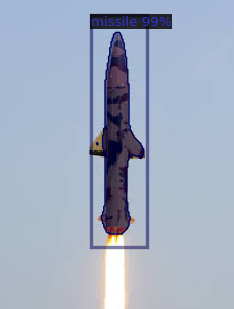

Relative Length of Instance: 1.00 units


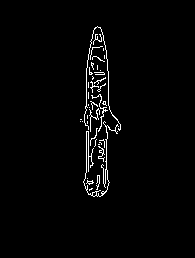

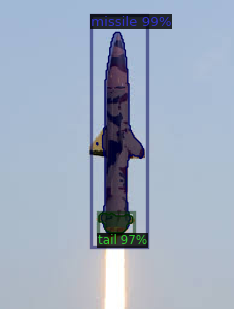

Relative Length of Instance: 0.11 units


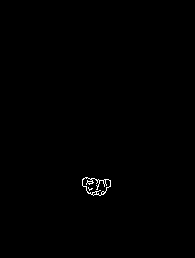

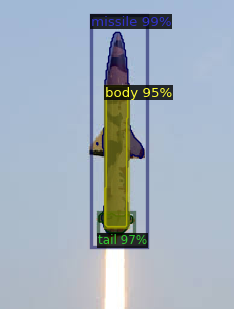

Relative Length of Instance: 0.63 units


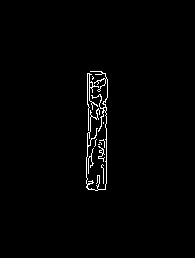

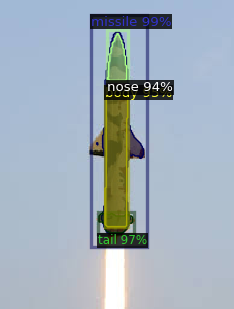

Relative Length of Instance: 0.14 units


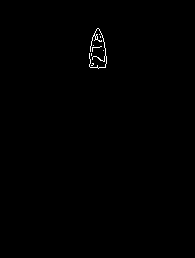

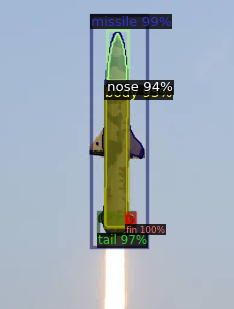

Relative Length of Instance: 0.01 units


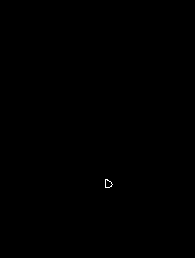

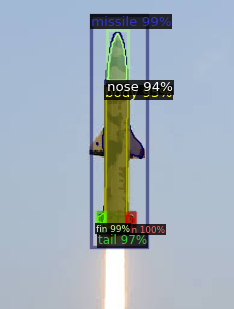

Relative Length of Instance: 0.01 units


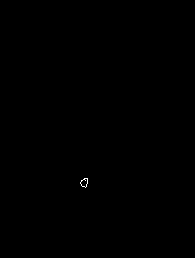

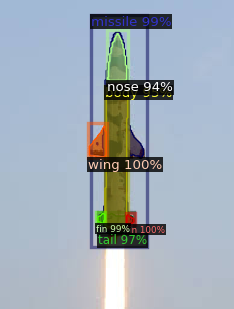

Relative Length of Instance: 0.08 units


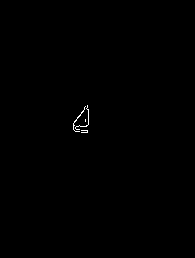

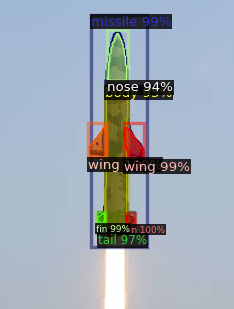

Relative Length of Instance: 0.08 units


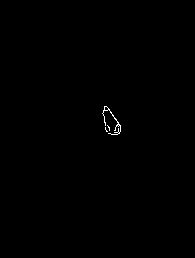

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer
import numpy as np

# Load the image
image_path = "/content/drive/MyDrive/10DATA/images.jpeg"
new_im = cv2.imread(image_path)

# Check if the image was loaded successfully
if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize containers for storing images
output_images = []

# Initialize a dictionary to store the maximum instance for each class and lists for "fin" and "wing"
max_instances = {}
fin_instances = []
wing_instances = []

# Loop through each instance
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()

    class_name = train_metadata.thing_classes[pred_class]

    # Separate instances of "fin" and "wing"
    if class_name == "fin":
        fin_instances.append(instances[i:i+1])
    elif class_name == "wing":
        wing_instances.append(instances[i:i+1])
    else:
        # Check if we already have an instance for this class
        if pred_class in max_instances:
            # If current instance has a higher score, update it
            if score > max_instances[pred_class]['score']:
                max_instances[pred_class] = {
                    'instance': instances[i:i+1],
                    'score': score
                }
        else:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score
            }

# Calculate the total area of instances in the "missile" class
total_missile_area = 0

# Loop through instances to calculate total area of "missile" instances
for instance in max_instances.values():
    pred_class = instance['instance'].pred_classes.item()
    if train_metadata.thing_classes[pred_class] == 'missile':
        masks = instance['instance'].pred_masks.cpu().numpy()
        for mask in masks:
            total_missile_area += np.sum(mask)

# Visualize and store the maximum instance for each class (except "fin" and "wing")
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata, scale=1.2)

for key in max_instances:
    max_instance = max_instances[key]['instance']
    out = v.draw_instance_predictions(max_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

    # Extract instance mask
    mask = max_instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

    # Calculate area of the instance mask
    instance_area = np.sum(mask)

    # Calculate relative length compared to total "missile" class area
    relative_length = instance_area / total_missile_area

    # Display relative length
    print(f"Relative Length of Instance: {relative_length:.2f} units")

    # Convert the masked image to grayscale
    gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detection
    edges = cv2.Canny(gray_image, 100, 200)

    # Display the edges
    cv2_imshow(edges)

# Visualize and store all instances of "fin"
for fin_instance in fin_instances:
    out = v.draw_instance_predictions(fin_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

    # Extract instance mask
    mask = fin_instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

    # Calculate area of the instance mask
    instance_area = np.sum(mask)

    # Calculate relative length compared to total "missile" class area
    relative_length = instance_area / total_missile_area

    # Display relative length
    print(f"Relative Length of Instance: {relative_length:.2f} units")

    # Convert the masked image to grayscale
    gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detection
    edges = cv2.Canny(gray_image, 100, 200)

    # Display the edges
    cv2_imshow(edges)

# Visualize and store all instances of "wing"
for wing_instance in wing_instances:
    out = v.draw_instance_predictions(wing_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

    # Extract instance mask
    mask = wing_instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

    # Calculate area of the instance mask
    instance_area = np.sum(mask)

    # Calculate relative length compared to total "missile" class area
    relative_length = instance_area / total_missile_area

    # Display relative length
    print(f"Relative Length of Instance: {relative_length:.2f} units")

    # Convert the masked image to grayscale
    gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detection
    edges = cv2.Canny(gray_image, 100, 200)

    # Display the edges
    cv2_imshow(edges)

# Now output_images contains all the images as numpy arrays
# Example: To access the first image
first_image = output_images[0]


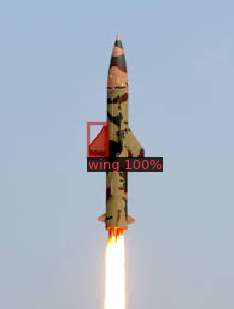

Relative Width of Instance: 0.08 units


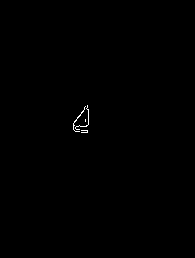

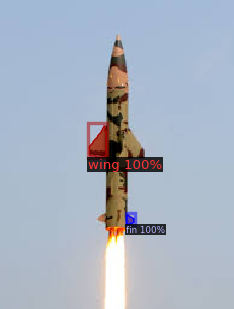

Relative Width of Instance: 0.01 units


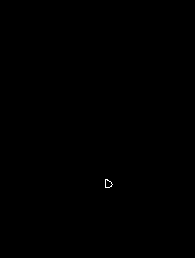

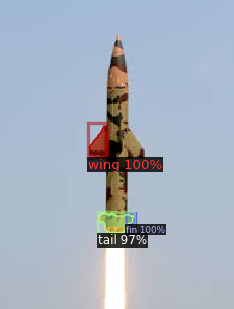

Relative Width of Instance: 0.11 units


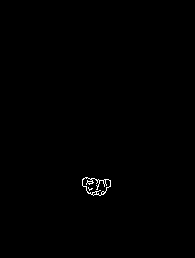

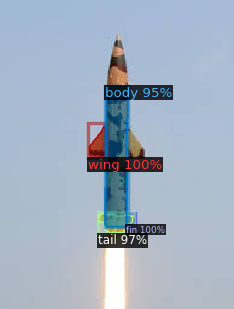

Relative Width of Instance: 0.63 units


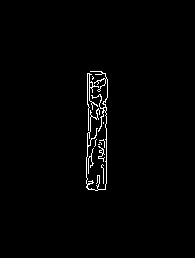

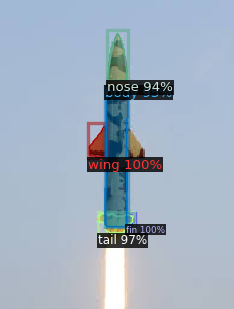

Relative Width of Instance: 0.14 units


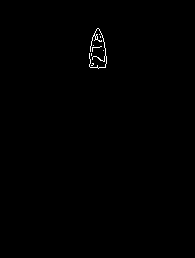

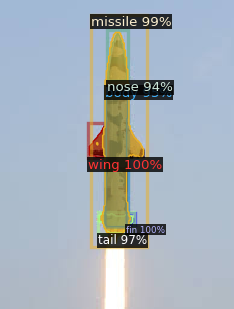

Relative Width of missile: 1.00 units


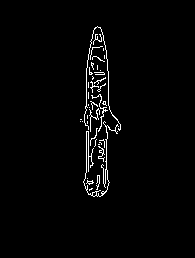

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer
import numpy as np

# Load the image
image_path = "/content/drive/MyDrive/10DATA/images.jpeg"
new_im = cv2.imread(image_path)

# Check if the image was loaded successfully
if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize containers for storing images
output_images = []

# Initialize a dictionary to store the maximum instance for each class and lists for specific instances
max_instances = {}
specific_instances = {}

# Loop through each instance
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()

    class_name = train_metadata.thing_classes[pred_class]

    # Separate specific instances
    if class_name in ["missile", "rocket", "bullet"]:  # Replace with actual classes
        if class_name not in specific_instances:
            specific_instances[class_name] = []
        specific_instances[class_name].append(instances[i:i+1])
    else:
        # Check if we already have an instance for this class
        if pred_class in max_instances:
            # If current instance has a higher score, update it
            if score > max_instances[pred_class]['score']:
                max_instances[pred_class] = {
                    'instance': instances[i:i+1],
                    'score': score
                }
        else:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score
            }

# Calculate the total area of instances in the "missile" class as 1 unit width
total_missile_area = 0

# Loop through missile instances to calculate total area
for instance in specific_instances.get("missile", []):
    masks = instance.get("pred_masks").cpu().numpy()
    for mask in masks:
        total_missile_area += np.sum(mask)

# Visualize and store the maximum instance for each class
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata, scale=1.2)

for key in max_instances:
    max_instance = max_instances[key]['instance']
    out = v.draw_instance_predictions(max_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

    # Extract instance mask
    mask = max_instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

    # Calculate area of the instance mask
    instance_area = np.sum(mask)

    # Calculate relative width compared to total missile area
    relative_width = instance_area / total_missile_area

    # Display relative width
    print(f"Relative Width of Instance: {relative_width:.2f} units")

    # Convert the masked image to grayscale
    gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detection
    edges = cv2.Canny(gray_image, 100, 200)

    # Display the edges
    cv2_imshow(edges)

# Visualize and store specific instances
for instance_name, instance_list in specific_instances.items():
    for specific_instance in instance_list:
        out = v.draw_instance_predictions(specific_instance)
        output_image = out.get_image()[:, :, ::-1]
        output_images.append(output_image)
        cv2_imshow(output_image)

        # Extract instance mask
        mask = specific_instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

        # Calculate area of the instance mask
        instance_area = np.sum(mask)

        # Calculate relative width compared to total missile area
        relative_width = instance_area / total_missile_area

        # Display relative width
        print(f"Relative Width of {instance_name}: {relative_width:.2f} units")

        # Convert the masked image to grayscale
        gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

        # Apply Canny edge detection
        edges = cv2.Canny(gray_image, 100, 200)

        # Display the edges
        cv2_imshow(edges)

# Now output_images contains all the images as numpy arrays
# Example: To access the first image
first_image = output_images[0]


# PART MEASUREMENT

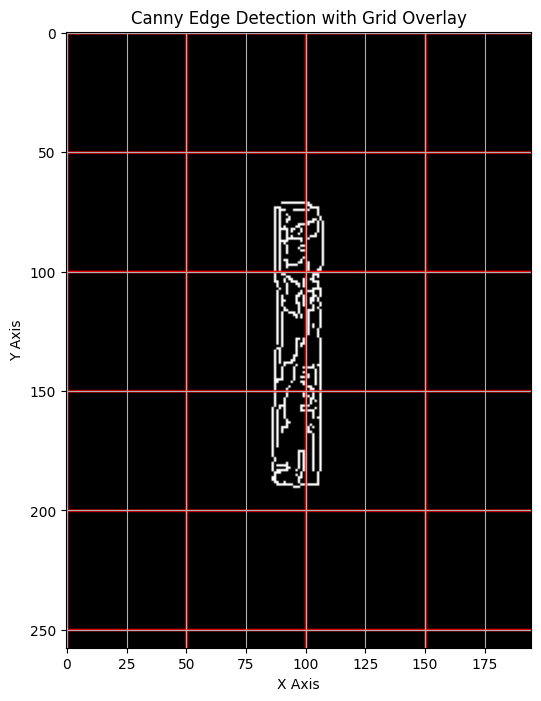

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Function to draw grid on an image
def draw_grid(img, grid_size=50, color=(0, 255, 0), thickness=1):
    h, w = img.shape[:2]
    # Draw horizontal lines
    for y in range(0, h, grid_size):
        cv2.line(img, (0, y), (w, y), color, thickness)
    # Draw vertical lines
    for x in range(0, w, grid_size):
        cv2.line(img, (x, 0), (x, h), color, thickness)
    return img

# Load the image
image_path = "/content/drive/MyDrive/10DATA/images.jpeg"
new_im = cv2.imread(image_path)

# Check if the image was loaded successfully
if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor (replace this with your actual predictor function)
# Assuming predictor is defined and works correctly
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize a dictionary to store the maximum instance for each class
max_instances = {}

# Loop through each instance
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()

    class_name = train_metadata.thing_classes[pred_class]

    # Check if we already have an instance for this class
    if pred_class in max_instances:
        # If current instance has a higher score, update it
        if score > max_instances[pred_class]['score']:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score
            }
    else:
        max_instances[pred_class] = {
            'instance': instances[i:i+1],
            'score': score
        }

# Calculate the total area of instances in the "missile" class
total_missile_area = 0

# Loop through instances to calculate total area of "missile" instances
for instance in max_instances.values():
    pred_class = instance['instance'].pred_classes.item()
    if train_metadata.thing_classes[pred_class] == 'missile':
        masks = instance['instance'].pred_masks.cpu().numpy()
        for mask in masks:
            total_missile_area += np.sum(mask)

# Process only the "nose" instances
for key in max_instances:
    max_instance = max_instances[key]['instance']
    pred_class = max_instance.pred_classes.item()

    if train_metadata.thing_classes[pred_class] == 'body':
        # Extract instance mask
        mask = max_instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

        # Convert the masked image to grayscale
        gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

        # Apply Canny edge detection
        edges = cv2.Canny(gray_image, 100, 200)

        # Convert edges to a 3-channel image for color grid overlay
        edges_colored = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

        # Draw grid on the colored Canny edge image
        edges_with_grid = draw_grid(edges_colored, color=(0, 0, 255))

        # Plot the image using Matplotlib
        plt.figure(figsize=(10, 8))
        plt.imshow(cv2.cvtColor(edges_with_grid, cv2.COLOR_BGR2RGB))
        plt.title('Canny Edge Detection with Grid Overlay')
        plt.xlabel('X Axis')
        plt.ylabel('Y Axis')
        plt.grid(True)  # Enable grid lines
        plt.show()


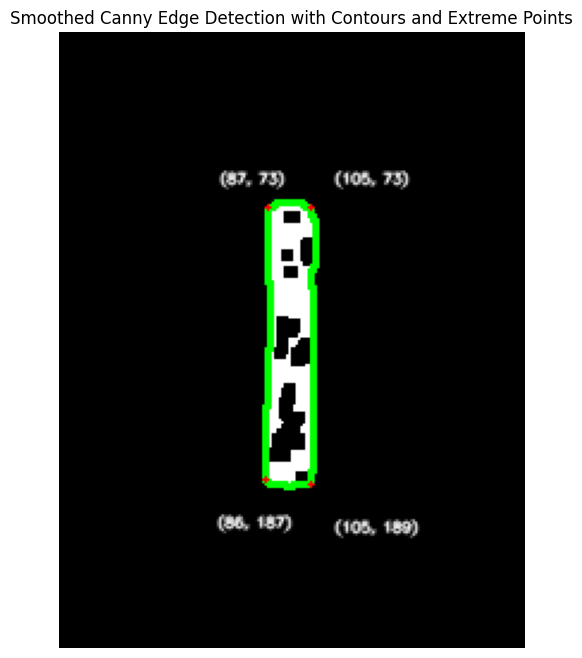

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Assuming `new_im`, `mask`, and `draw_grid` are defined as in the previous code snippets

# Convert the masked image to grayscale
gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

# Apply Canny edge detection
edges = cv2.Canny(gray_image, 100, 200)

# Morphological closing to smooth out edges
kernel = np.ones((5, 5), np.uint8)
smooth_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

# Convert edges to a 3-channel image for color grid overlay
edges_colored = cv2.cvtColor(smooth_edges, cv2.COLOR_GRAY2BGR)

# Find contours from the smoothed edges
contours, _ = cv2.findContours(smooth_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours and extreme points on the colored smoothed edges image
for contour in contours:
    # Draw the contour
    cv2.drawContours(edges_colored, [contour], -1, (0, 255, 0), 2)

    # Calculate extreme points (corners)
    topmost_left = tuple(contour[np.argmin(contour[:, :, 1] + contour[:, :, 0])][0])
    topmost_right = tuple(contour[np.argmin(contour[:, :, 1] - contour[:, :, 0])][0])
    bottommost_left = tuple(contour[np.argmax(contour[:, :, 1] - contour[:, :, 0])][0])
    bottommost_right = tuple(contour[np.argmax(contour[:, :, 1] + contour[:, :, 0])][0])

    # Draw extreme points (corners) on the image
    cv2.circle(edges_colored, topmost_left, 1, (0, 0, 255), -1)  # Red color for topmost left point
    cv2.circle(edges_colored, topmost_right, 1, (0, 0, 255), -1)  # Red color for topmost right point
    cv2.circle(edges_colored, bottommost_left, 1, (0, 0, 255), -1)  # Red color for bottommost left point
    cv2.circle(edges_colored, bottommost_right, 1, (0, 0, 255), -1)  # Red color for bottommost right point

    # Annotate extreme points with their coordinates (smaller text)
    font_scale = 0.2  # Adjust font scale for smaller text
    cv2.putText(edges_colored, f'({topmost_left[0]}, {topmost_left[1]})', (topmost_left[0] - 20, topmost_left[1] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
    cv2.putText(edges_colored, f'({topmost_right[0]}, {topmost_right[1]})', (topmost_right[0] + 10, topmost_right[1] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
    cv2.putText(edges_colored, f'({bottommost_left[0]}, {bottommost_left[1]})', (bottommost_left[0] - 20, bottommost_left[1] + 20),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
    cv2.putText(edges_colored, f'({bottommost_right[0]}, {bottommost_right[1]})', (bottommost_right[0] + 10, bottommost_right[1] + 20),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)

# Plot the image with contours, extreme points, and coordinates using Matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(edges_colored, cv2.COLOR_BGR2RGB))
plt.title('Smoothed Canny Edge Detection with Contours and Extreme Points')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.grid(True)  # Enable grid lines
plt.axis('off')  # Turn off axis labels
plt.show()


In [ ]:
from scipy.spatial import distance
 #Calculate distances between all points
points = [topmost_left, topmost_right, bottommost_left, bottommost_right]
distances = {f"{chr(97 + i)}-{chr(97 + j)}": distance.euclidean(points[i], points[j])
    for i in range(len(points)) for j in range(i + 1, len(points))}

    # Display distances on the image
for i, (key, value) in enumerate(distances.items()):
      cv2.putText(edges_colored, f'{key}: {value:.2f}', (10, 30 + i * 20),
      cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1, cv2.LINE_AA)

print("Distances between points:")
for key, value in distances.items():
    print(f'{key}: {value:.2f}')


Distances between points:
a-b: 18.00
a-c: 114.00
a-d: 117.39
b-c: 115.57
b-d: 116.00
c-d: 19.10


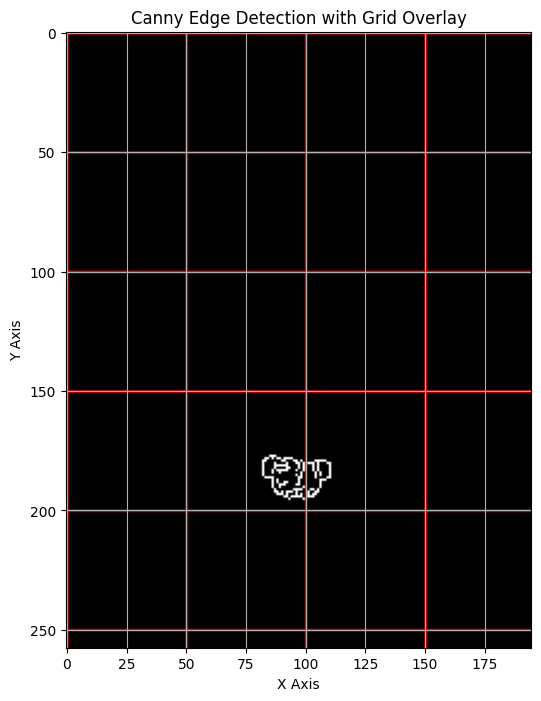

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Function to draw grid on an image
def draw_grid(img, grid_size=50, color=(0, 255, 0), thickness=1):
    h, w = img.shape[:2]
    # Draw horizontal lines
    for y in range(0, h, grid_size):
        cv2.line(img, (0, y), (w, y), color, thickness)
    # Draw vertical lines
    for x in range(0, w, grid_size):
        cv2.line(img, (x, 0), (x, h), color, thickness)
    return img

# Load the image
image_path = "/content/drive/MyDrive/10DATA/images.jpeg"
new_im = cv2.imread(image_path)

# Check if the image was loaded successfully
if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor (replace this with your actual predictor function)
# Assuming predictor is defined and works correctly
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize a dictionary to store the maximum instance for each class
max_instances = {}

# Loop through each instance
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()

    class_name = train_metadata.thing_classes[pred_class]

    # Check if we already have an instance for this class
    if pred_class in max_instances:
        # If current instance has a higher score, update it
        if score > max_instances[pred_class]['score']:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score
            }
    else:
        max_instances[pred_class] = {
            'instance': instances[i:i+1],
            'score': score
        }

# Calculate the total area of instances in the "missile" class
total_missile_area = 0

# Loop through instances to calculate total area of "missile" instances
for instance in max_instances.values():
    pred_class = instance['instance'].pred_classes.item()
    if train_metadata.thing_classes[pred_class] == 'missile':
        masks = instance['instance'].pred_masks.cpu().numpy()
        for mask in masks:
            total_missile_area += np.sum(mask)

# Process only the "nose" instances
for key in max_instances:
    max_instance = max_instances[key]['instance']
    pred_class = max_instance.pred_classes.item()

    if train_metadata.thing_classes[pred_class] == 'tail':
        # Extract instance mask
        mask = max_instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

        # Convert the masked image to grayscale
        gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

        # Apply Canny edge detection
        edges = cv2.Canny(gray_image, 100, 200)

        # Convert edges to a 3-channel image for color grid overlay
        edges_colored = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

        # Draw grid on the colored Canny edge image
        edges_with_grid = draw_grid(edges_colored, color=(0, 0, 255))

        # Plot the image using Matplotlib
        plt.figure(figsize=(10, 8))
        plt.imshow(cv2.cvtColor(edges_with_grid, cv2.COLOR_BGR2RGB))
        plt.title('Canny Edge Detection with Grid Overlay')
        plt.xlabel('X Axis')
        plt.ylabel('Y Axis')
        plt.grid(True)  # Enable grid lines
        plt.show()


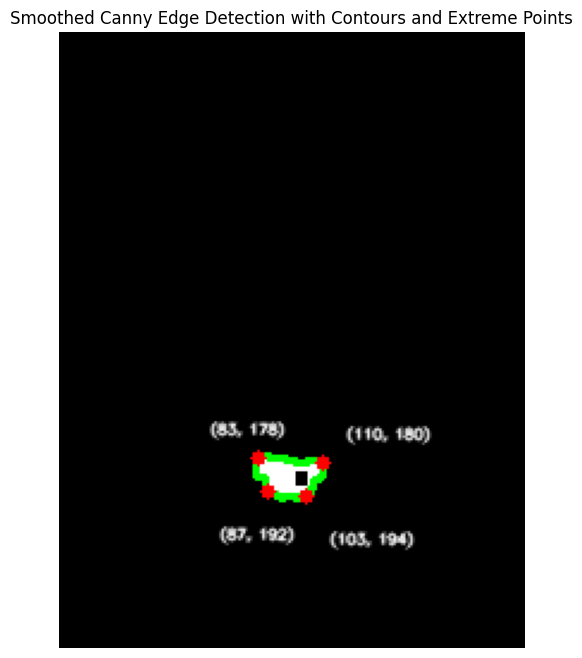

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Assuming `new_im`, `mask`, and `draw_grid` are defined as in the previous code snippets

# Convert the masked image to grayscale
gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

# Apply Canny edge detection
edges = cv2.Canny(gray_image, 100, 200)

# Morphological closing to smooth out edges
kernel = np.ones((5, 5), np.uint8)
smooth_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

# Convert edges to a 3-channel image for color grid overlay
edges_colored = cv2.cvtColor(smooth_edges, cv2.COLOR_GRAY2BGR)

# Find contours from the smoothed edges
contours, _ = cv2.findContours(smooth_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours and extreme points on the colored smoothed edges image
for contour in contours:
    # Draw the contour
    cv2.drawContours(edges_colored, [contour], -1, (0, 255, 0), 2)

    # Calculate extreme points (corners)
    topmost_left = tuple(contour[np.argmin(contour[:, :, 1] + contour[:, :, 0])][0])
    topmost_right = tuple(contour[np.argmin(contour[:, :, 1] - contour[:, :, 0])][0])
    bottommost_left = tuple(contour[np.argmax(contour[:, :, 1] - contour[:, :, 0])][0])
    bottommost_right = tuple(contour[np.argmax(contour[:, :, 1] + contour[:, :, 0])][0])

    # Draw extreme points (corners) on the image
    cv2.circle(edges_colored, topmost_left, 3, (0, 0, 255), -1)  # Red color for topmost left point
    cv2.circle(edges_colored, topmost_right, 3, (0, 0, 255), -1)  # Red color for topmost right point
    cv2.circle(edges_colored, bottommost_left, 3, (0, 0, 255), -1)  # Red color for bottommost left point
    cv2.circle(edges_colored, bottommost_right, 3, (0, 0, 255), -1)  # Red color for bottommost right point

    # Annotate extreme points with their coordinates (smaller text)
    font_scale = 0.2  # Adjust font scale for smaller text
    cv2.putText(edges_colored, f'({topmost_left[0]}, {topmost_left[1]})', (topmost_left[0] - 20, topmost_left[1] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
    cv2.putText(edges_colored, f'({topmost_right[0]}, {topmost_right[1]})', (topmost_right[0] + 10, topmost_right[1] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
    cv2.putText(edges_colored, f'({bottommost_left[0]}, {bottommost_left[1]})', (bottommost_left[0] - 20, bottommost_left[1] + 20),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
    cv2.putText(edges_colored, f'({bottommost_right[0]}, {bottommost_right[1]})', (bottommost_right[0] + 10, bottommost_right[1] + 20),
                cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)

# Plot the image with contours, extreme points, and coordinates using Matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(edges_colored, cv2.COLOR_BGR2RGB))
plt.title('Smoothed Canny Edge Detection with Contours and Extreme Points')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.grid(True)  # Enable grid lines
plt.axis('off')  # Turn off axis labels
plt.show()


In [ ]:
from scipy.spatial import distance
 #Calculate distances between all points
points = [topmost_left, topmost_right, bottommost_left, bottommost_right]
distances = {f"{chr(97 + i)}-{chr(97 + j)}": distance.euclidean(points[i], points[j])
    for i in range(len(points)) for j in range(i + 1, len(points))}

    # Display distances on the image
for i, (key, value) in enumerate(distances.items()):
      cv2.putText(edges_colored, f'{key}: {value:.2f}', (10, 30 + i * 20),
      cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1, cv2.LINE_AA)

print("Distances between points:")
for key, value in distances.items():
    print(f'{key}: {value:.2f}')


Distances between points:
a-b: 27.07
a-c: 14.56
a-d: 25.61
b-c: 25.94
b-d: 15.65
c-d: 16.12


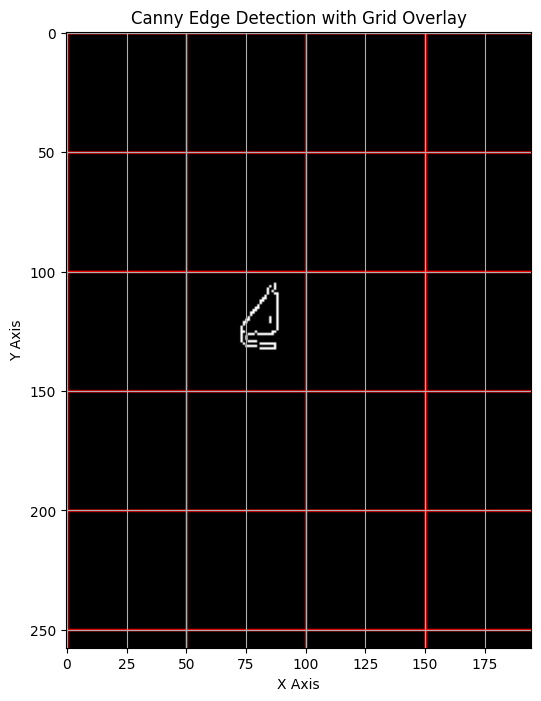

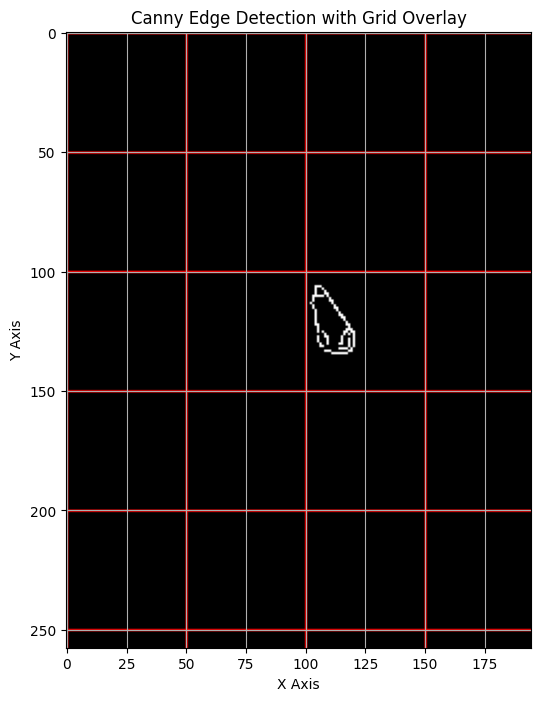

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Function to draw grid on an image
def draw_grid(img, grid_size=50, color=(0, 255, 0), thickness=1):
    h, w = img.shape[:2]
    # Draw horizontal lines
    for y in range(0, h, grid_size):
        cv2.line(img, (0, y), (w, y), color, thickness)
    # Draw vertical lines
    for x in range(0, w, grid_size):
        cv2.line(img, (x, 0), (x, h), color, thickness)
    return img

# Load the image
image_path = "/content/drive/MyDrive/10DATA/images.jpeg"
new_im = cv2.imread(image_path)

# Check if the image was loaded successfully
if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor (replace this with your actual predictor function)
# Assuming predictor is defined and works correctly
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize a dictionary to store the instances for each class
all_instances = {}

# Loop through each instance and group by class
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()
    class_name = train_metadata.thing_classes[pred_class]

    if pred_class not in all_instances:
        all_instances[pred_class] = []

    all_instances[pred_class].append(instances[i:i+1])

# Calculate the total area of instances in the "missile" class
total_missile_area = 0

# Loop through instances to calculate total area of "missile" instances
for instance_list in all_instances.values():
    for instance in instance_list:
        pred_class = instance.pred_classes.item()
        if train_metadata.thing_classes[pred_class] == 'missile':
            masks = instance.pred_masks.cpu().numpy()
            for mask in masks:
                total_missile_area += np.sum(mask)

# Process only the "wing" instances
for pred_class, instance_list in all_instances.items():
    if train_metadata.thing_classes[pred_class] == 'wing':
        for instance in instance_list:
            # Extract instance mask
            mask = instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

            # Convert the masked image to grayscale
            gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

            # Apply Canny edge detection
            edges = cv2.Canny(gray_image, 100, 200)

            # Convert edges to a 3-channel image for color grid overlay
            edges_colored = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

            # Draw grid on the colored Canny edge image
            edges_with_grid = draw_grid(edges_colored, color=(0, 0, 255))

            # Plot the image using Matplotlib
            plt.figure(figsize=(10, 8))
            plt.imshow(cv2.cvtColor(edges_with_grid, cv2.COLOR_BGR2RGB))
            plt.title('Canny Edge Detection with Grid Overlay')
            plt.xlabel('X Axis')
            plt.ylabel('Y Axis')
            plt.grid(True)  # Enable grid lines
            plt.show()


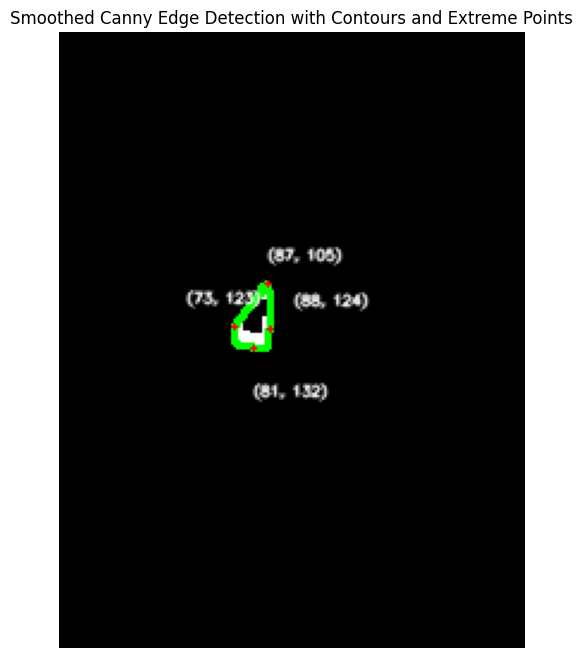

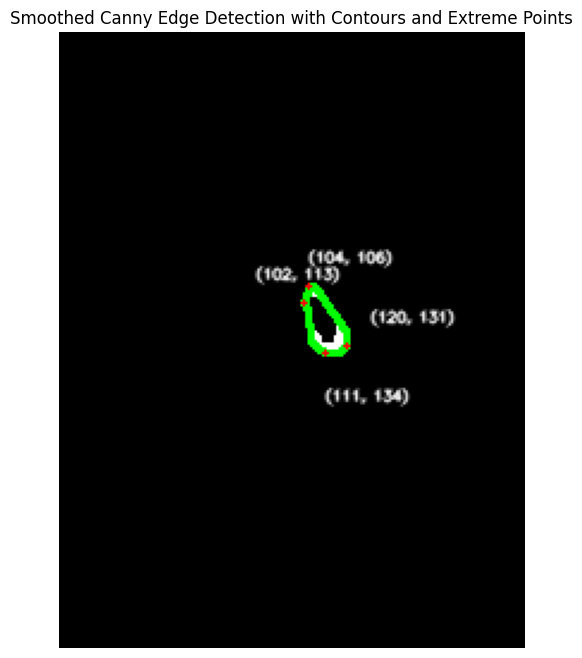

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Function to draw grid on an image
def draw_grid(img, grid_size=50, color=(0, 255, 0), thickness=1):
    h, w = img.shape[:2]
    # Draw horizontal lines
    for y in range(0, h, grid_size):
        cv2.line(img, (0, y), (w, y), color, thickness)
    # Draw vertical lines
    for x in range(0, w, grid_size):
        cv2.line(img, (x, 0), (x, h), color, thickness)
    return img

# Load the image
image_path = "/content/drive/MyDrive/10DATA/images.jpeg"
new_im = cv2.imread(image_path)

# Check if the image was loaded successfully
if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor (replace this with your actual predictor function)
# Assuming predictor is defined and works correctly
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize a dictionary to store the instances for each class
all_instances = {}

# Loop through each instance and group by class
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()
    class_name = train_metadata.thing_classes[pred_class]

    if pred_class not in all_instances:
        all_instances[pred_class] = []

    all_instances[pred_class].append(instances[i:i+1])

# Calculate the total area of instances in the "missile" class
total_missile_area = 0

# Loop through instances to calculate total area of "missile" instances
for instance_list in all_instances.values():
    for instance in instance_list:
        pred_class = instance.pred_classes.item()
        if train_metadata.thing_classes[pred_class] == 'missile':
            masks = instance.pred_masks.cpu().numpy()
            for mask in masks:
                total_missile_area += np.sum(mask)

# Process only the "wing" instances
for pred_class, instance_list in all_instances.items():
    if train_metadata.thing_classes[pred_class] == 'wing':
        for instance in instance_list:
            # Extract instance mask
            mask = instance.get("pred_masks").cpu().numpy()[0]  # Assuming only one instance per class

            # Convert the masked image to grayscale
            gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)

            # Apply Canny edge detection
            edges = cv2.Canny(gray_image, 100, 200)

            # Morphological closing to smooth out edges
            kernel = np.ones((5, 5), np.uint8)
            smooth_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

            # Convert edges to a 3-channel image for color grid overlay
            edges_colored = cv2.cvtColor(smooth_edges, cv2.COLOR_GRAY2BGR)

            # Find contours from the smoothed edges
            contours, _ = cv2.findContours(smooth_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            # Draw contours and extreme points on the colored smoothed edges image
            for contour in contours:
                # Draw the contour
                cv2.drawContours(edges_colored, [contour], -1, (0, 255, 0), 2)

                # Calculate extreme points (corners)
                leftmost = tuple(contour[contour[:, :, 0].argmin()][0])
                rightmost = tuple(contour[contour[:, :, 0].argmax()][0])
                topmost = tuple(contour[contour[:, :, 1].argmin()][0])
                bottommost = tuple(contour[contour[:, :, 1].argmax()][0])

                # Draw extreme points (corners) on the image
                cv2.circle(edges_colored, leftmost, 1, (0, 0, 255), -1)  # Red color for leftmost point
                cv2.circle(edges_colored, rightmost, 1, (0, 0, 255), -1)  # Red color for rightmost point
                cv2.circle(edges_colored, topmost, 1, (0, 0, 255), -1)  # Red color for topmost point
                cv2.circle(edges_colored, bottommost, 1, (0, 0, 255), -1)  # Red color for bottommost point

                # Annotate extreme points with their coordinates (smaller text)
                font_scale = 0.2  # Adjust font scale for smaller text
                cv2.putText(edges_colored, f'({leftmost[0]}, {leftmost[1]})', (leftmost[0] - 20, leftmost[1] - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
                cv2.putText(edges_colored, f'({rightmost[0]}, {rightmost[1]})', (rightmost[0] + 10, rightmost[1] - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
                cv2.putText(edges_colored, f'({topmost[0]}, {topmost[1]})', (topmost[0], topmost[1] - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)
                cv2.putText(edges_colored, f'({bottommost[0]}, {bottommost[1]})', (bottommost[0], bottommost[1] + 20),
                            cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 1, cv2.LINE_AA)

            # Plot the image with contours, extreme points, and coordinates using Matplotlib
            plt.figure(figsize=(10, 8))
            plt.imshow(cv2.cvtColor(edges_colored, cv2.COLOR_BGR2RGB))
            plt.title('Smoothed Canny Edge Detection with Contours and Extreme Points')
            plt.xlabel('X Axis')
            plt.ylabel('Y Axis')
            plt.grid(True)  # Enable grid lines
            plt.axis('off')  # Turn off axis labels
            plt.show()


In [ ]:
from scipy.spatial import distance
 #Calculate distances between all points
points = [topmost_left, topmost_right, bottommost_left, bottommost_right]
distances = {f"{chr(97 + i)}-{chr(97 + j)}": distance.euclidean(points[i], points[j])
    for i in range(len(points)) for j in range(i + 1, len(points))}

    # Display distances on the image
for i, (key, value) in enumerate(distances.items()):
      cv2.putText(edges_colored, f'{key}: {value:.2f}', (10, 30 + i * 20),
      cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1, cv2.LINE_AA)

print("Distances between points:")
for key, value in distances.items():
    print(f'{key}: {value:.2f}')


Distances between points:
a-b: 27.07
a-c: 14.56
a-d: 25.61
b-c: 25.94
b-d: 15.65
c-d: 16.12


Farthest Points: (470, 71), (405, 212)


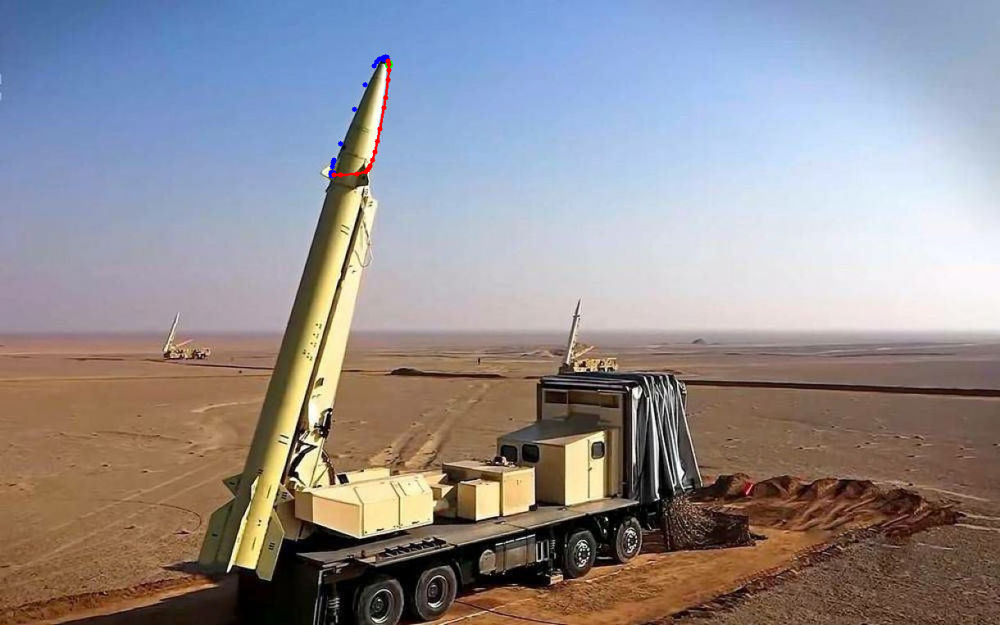

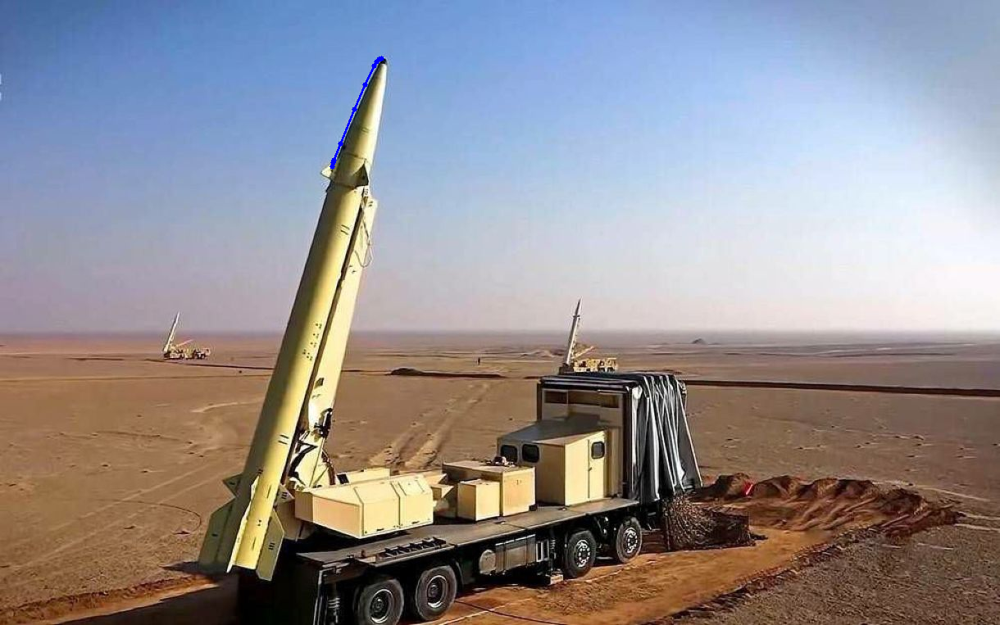

In [ ]:
import cv2
import numpy as np
import random
import math
from google.colab.patches import cv2_imshow

l = []  # List to store points

# Function to find and draw key points on the image
def draw_keypoints_on_image(mask, image):
    # Convert the mask to a format suitable for findContours
    mask = (mask * 255).astype(np.uint8)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        raise ValueError("No contours found in the mask")

    # Assuming the largest contour is the one we need
    contour = max(contours, key=cv2.contourArea)

    # Compute the convex hull of the contour
    hull = cv2.convexHull(contour)

    # Identify the extreme points on the convex hull
    top_most = tuple(hull[hull[:, :, 1].argmin()][0])
    left_most = tuple(hull[hull[:, :, 0].argmin()][0])
    right_most = tuple(hull[hull[:, :, 0].argmax()][0])

    # Assume top_most is the tip of the nose and left_most and right_most are the bottom edges
    nose_tip = top_most
    bottom_edge1 = left_most
    bottom_edge2 = right_most

    key_points = [nose_tip, bottom_edge1, bottom_edge2]

    # Draw key points on the image
    for point in key_points:
        cv2.circle(image, point, 5, (0, 255, 0), -1)

    # Draw hull points on the image
    for point in hull:
        cv2.circle(image, tuple(point[0]), 3, (255, 0, 0), -1)  # Smaller circles for hull points

    return image, key_points, hull

# Function to find farthest points and draw them on the image
def find_and_draw_farthest_points(image_with_keypoints, key_points):
    # Calculate pairwise distances between key points
    distances = np.zeros((3, 3))
    for i in range(3):
        for j in range(3):
            distances[i, j] = np.linalg.norm(np.array(key_points[i]) - np.array(key_points[j]))

    # Find indices of the maximum distance
    i, j = np.unravel_index(np.argmax(distances), distances.shape)

    # Draw circles around the farthest points
    cv2.circle(image_with_keypoints, key_points[i], 5, (255, 0, 0), -1)
    cv2.circle(image_with_keypoints, key_points[j], 5, (255, 0, 0), -1)

    # Store the farthest points in list l
    l.append(key_points[i])
    l.append(key_points[j])

    # Print coordinates of the farthest points
    print(f"Farthest Points: {key_points[i]}, {key_points[j]}")

    return image_with_keypoints, key_points[i], key_points[j]

# Function to determine which side of a line a point lies on
def point_side_of_line(point, line_point1, line_point2):
    """
    Determine which side of a line a point lies on.

    Args:
    point: A tuple or list with two elements representing the point (x, y).
    line_point1: A tuple or list with two elements representing the first point of the line (x1, y1).
    line_point2: A tuple or list with two elements representing the second point of the line (x2, y2).

    Returns:
    1 if point is on the left side of the line, -1 if on the right side, and 0 if collinear.
    """
    x, y = point
    x1, y1 = line_point1
    x2, y2 = line_point2

    # Determine the relative position of the point to the line using cross product
    cross_product = (x - x1) * (y2 - y1) - (y - y1) * (x2 - x1)

    if cross_product > 0:
        return 1  # Point is on the left side of the line
    elif cross_product < 0:
        return -1  # Point is on the right side of the line
    else:
        return 0  # Point is collinear with the line

# Load the image
image_path = "/content/drive/MyDrive/10DATA/mis8.jpeg"
new_im = cv2.imread(image_path)

# Apply Gaussian blur to smooth out the image and reduce noise
blurred_im = cv2.GaussianBlur(new_im, (5, 5), 0)

# Run the predictor
outputs = predictor(blurred_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize a dictionary to store the maximum instance for each class
max_instances = {}

# Loop through each instance
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()
    class_name = train_metadata.thing_classes[pred_class]

    # Check if we already have an instance for this class
    if pred_class in max_instances:
        # If current instance has a higher score, update it
        if score > max_instances[pred_class]['score']:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score
            }
    else:
        max_instances[pred_class] = {
            'instance': instances[i:i+1],
            'score': score
        }

# Assuming 'nose' is a class in your metadata
nose_class_id = train_metadata.thing_classes.index('nose')
nose_instance = max_instances.get(nose_class_id)

if nose_instance:
    mask = nose_instance['instance'].pred_masks[0].numpy()
    image_with_keypoints, key_points, hull = draw_keypoints_on_image(mask, new_im.copy())

    # Find and draw the farthest points
    image_with_keypoints, farthest_point1, farthest_point2 = find_and_draw_farthest_points(image_with_keypoints, key_points)

    # Determine the line equation using the farthest points
    line_point1 = farthest_point1
    line_point2 = farthest_point2

    # Show only the red points (points on the left side of the line)
    red_points = []
    for point in hull:
        if point_side_of_line(tuple(point[0]), line_point1, line_point2) == 1:
            cv2.circle(image_with_keypoints, tuple(point[0]), 3, (0, 0, 255), -1)  # Red circles for points on the left side
            red_points.append(tuple(point[0]))

    # Draw lines connecting the red points
    if len(red_points) > 1:
        for i in range(len(red_points) - 1):
            cv2.line(image_with_keypoints, red_points[i], red_points[i + 1], (0, 0, 255), 2)

    # Create a new image for the blue points
    blue_image = new_im.copy()

    # Show only the blue points (points on the right side of the line)
    blue_points = []
    for point in hull:
        if point_side_of_line(tuple(point[0]), line_point1, line_point2) == -1:
            cv2.circle(blue_image, tuple(point[0]), 3, (255, 0, 0), -1)  # Blue circles for points on the right side
            blue_points.append(tuple(point[0]))

    # Draw lines connecting the blue points
    if len(blue_points) > 1:
        for i in range(len(blue_points) - 1):
            cv2.line(blue_image, blue_points[i], blue_points[i + 1], (255, 0, 0), 2)

    # Display the final images
    cv2_imshow(image_with_keypoints)  # Image with red points
    cv2_imshow(blue_image)  # Image with blue points

else:
    print("Nose class not detected.")


Farthest Points: (158, 11), (146, 80)
Total length of the red path: 68.70995148401536
Total length of the blue path: 46.70982214103619


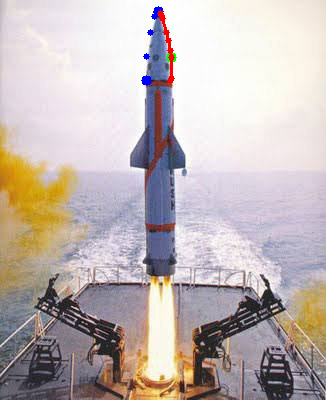

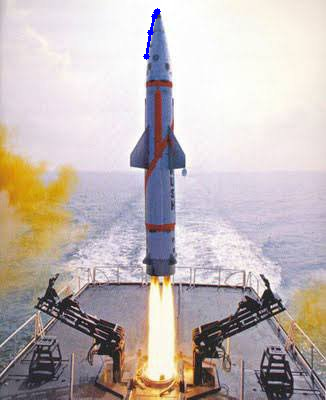

In [ ]:
import cv2
import numpy as np
import random
import math
from google.colab.patches import cv2_imshow

l = []  # List to store points

# Function to find and draw key points on the image
def draw_keypoints_on_image(mask, image):
    # Convert the mask to a format suitable for findContours
    mask = (mask * 255).astype(np.uint8)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        raise ValueError("No contours found in the mask")

    # Assuming the largest contour is the one we need
    contour = max(contours, key=cv2.contourArea)

    # Compute the convex hull of the contour
    hull = cv2.convexHull(contour)

    # Identify the extreme points on the convex hull
    top_most = tuple(hull[hull[:, :, 1].argmin()][0])
    left_most = tuple(hull[hull[:, :, 0].argmin()][0])
    right_most = tuple(hull[hull[:, :, 0].argmax()][0])

    # Assume top_most is the tip of the nose and left_most and right_most are the bottom edges
    nose_tip = top_most
    bottom_edge1 = left_most
    bottom_edge2 = right_most

    key_points = [nose_tip, bottom_edge1, bottom_edge2]

    # Draw key points on the image
    for point in key_points:
        cv2.circle(image, point, 5, (0, 255, 0), -1)

    # Draw hull points on the image
    for point in hull:
        cv2.circle(image, tuple(point[0]), 3, (255, 0, 0), -1)  # Smaller circles for hull points

    return image, key_points, hull

# Function to find farthest points and draw them on the image
def find_and_draw_farthest_points(image_with_keypoints, key_points):
    # Calculate pairwise distances between key points
    distances = np.zeros((3, 3))
    for i in range(3):
        for j in range(3):
            distances[i, j] = np.linalg.norm(np.array(key_points[i]) - np.array(key_points[j]))

    # Find indices of the maximum distance
    i, j = np.unravel_index(np.argmax(distances), distances.shape)

    # Draw circles around the farthest points
    cv2.circle(image_with_keypoints, key_points[i], 5, (255, 0, 0), -1)
    cv2.circle(image_with_keypoints, key_points[j], 5, (255, 0, 0), -1)

    # Store the farthest points in list l
    l.append(key_points[i])
    l.append(key_points[j])

    # Print coordinates of the farthest points
    print(f"Farthest Points: {key_points[i]}, {key_points[j]}")

    return image_with_keypoints, key_points[i], key_points[j]

# Function to determine which side of a line a point lies on
def point_side_of_line(point, line_point1, line_point2):
    """
    Determine which side of a line a point lies on.

    Args:
    point: A tuple or list with two elements representing the point (x, y).
    line_point1: A tuple or list with two elements representing the first point of the line (x1, y1).
    line_point2: A tuple or list with two elements representing the second point of the line (x2, y2).

    Returns:
    1 if point is on the left side of the line, -1 if on the right side, and 0 if collinear.
    """
    x, y = point
    x1, y1 = line_point1
    x2, y2 = line_point2

    # Determine the relative position of the point to the line using cross product
    cross_product = (x - x1) * (y2 - y1) - (y - y1) * (x2 - x1)

    if cross_product > 0:
        return 1  # Point is on the left side of the line
    elif cross_product < 0:
        return -1  # Point is on the right side of the line
    else:
        return 0  # Point is collinear with the line

# Load the image
image_path = "/content/drive/MyDrive/10DATA/mis9.jpeg"
new_im = cv2.imread(image_path)

# Apply Gaussian blur to smooth out the image and reduce noise
blurred_im = cv2.GaussianBlur(new_im, (5, 5), 0)

# Run the predictor
outputs = predictor(blurred_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize a dictionary to store the maximum instance for each class
max_instances = {}

# Loop through each instance
for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()
    class_name = train_metadata.thing_classes[pred_class]

    # Check if we already have an instance for this class
    if pred_class in max_instances:
        # If current instance has a higher score, update it
        if score > max_instances[pred_class]['score']:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score
            }
    else:
        max_instances[pred_class] = {
            'instance': instances[i:i+1],
            'score': score
        }

nose_class_id = train_metadata.thing_classes.index('nose')
nose_instance = max_instances.get(nose_class_id)

if nose_instance:
    mask = nose_instance['instance'].pred_masks[0].numpy()
    image_with_keypoints, key_points, hull = draw_keypoints_on_image(mask, new_im.copy())

    # Find and draw the farthest points
    image_with_keypoints, farthest_point1, farthest_point2 = find_and_draw_farthest_points(image_with_keypoints, key_points)

    # Determine the line equation using the farthest points
    line_point1 = farthest_point1
    line_point2 = farthest_point2

    # Show only the red points (points on the left side of the line)
    red_points = []
    for point in hull:
        if point_side_of_line(tuple(point[0]), line_point1, line_point2) == 1:
            cv2.circle(image_with_keypoints, tuple(point[0]), 3, (0, 0, 255), -1)  # Red circles for points on the left side
            red_points.append(tuple(point[0]))

    # Draw lines connecting the red points
    red_path_length = 0
    if len(red_points) > 1:
        for i in range(len(red_points) - 1):
            cv2.line(image_with_keypoints, red_points[i], red_points[i + 1], (0, 0, 255), 2)
            red_path_length += np.linalg.norm(np.array(red_points[i]) - np.array(red_points[i + 1]))

    print(f"Total length of the red path: {red_path_length}")

    # Create a new image for the blue points
    blue_image = new_im.copy()

    # Show only the blue points (points on the right side of the line)
    blue_points = []
    for point in hull:
        if point_side_of_line(tuple(point[0]), line_point1, line_point2) == -1:
            cv2.circle(blue_image, tuple(point[0]), 3, (255, 0, 0), -1)  # Blue circles for points on the right side
            blue_points.append(tuple(point[0]))

    # Draw lines connecting the blue points
    blue_path_length = 0
    if len(blue_points) > 1:
        for i in range(len(blue_points) - 1):
            cv2.line(blue_image, blue_points[i], blue_points[i + 1], (255, 0, 0), 2)
            blue_path_length += np.linalg.norm(np.array(blue_points[i]) - np.array(blue_points[i + 1]))

    print(f"Total length of the blue path: {blue_path_length}")

    # Display the final images
    cv2_imshow(image_with_keypoints)  # Image with red points
    cv2_imshow(blue_image)  # Image with blue points

else:
    print("Nose class not detected.")


Farthest Point 1 (Shorter Path): (146, 56)
Farthest Point 2 (Shorter Path): (157, 11)


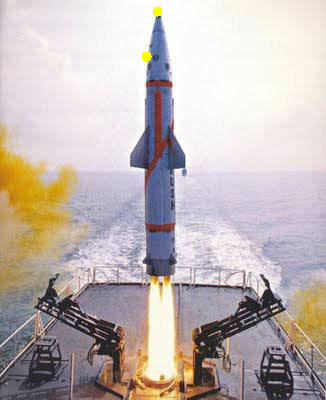

In [ ]:
# Function to calculate the length of a path given a list of points
def calculate_path_length(points):
    path_length = 0
    if len(points) > 1:
        for i in range(len(points) - 1):
            path_length += np.linalg.norm(np.array(points[i]) - np.array(points[i + 1]))
    return path_length

# Calculate the lengths of the red and blue paths
red_path_length = calculate_path_length(red_points)
blue_path_length = calculate_path_length(blue_points)

# Determine which path is shorter
shorter_path_points = red_points if red_path_length < blue_path_length else blue_points
path_color = (0, 0, 255) if red_path_length < blue_path_length else (255, 0, 0)  # Red or blue color

# Function to find farthest points in a given list of points
def find_farthest_points_in_list(points):
    max_distance = 0
    farthest_points = (None, None)
    for i in range(len(points)):
        for j in range(i + 1, len(points)):
            distance = np.linalg.norm(np.array(points[i]) - np.array(points[j]))
            if distance > max_distance:
                max_distance = distance
                farthest_points = (points[i], points[j])
    return farthest_points

# Find the farthest points in the shorter path
farthest_point1_shorter_path, farthest_point2_shorter_path = find_farthest_points_in_list(shorter_path_points)

# Draw circles around the farthest points in the shorter path
cv2.circle(new_im, farthest_point1_shorter_path, 5, (0, 255, 255), -1)  # Yellow circle
cv2.circle(new_im, farthest_point2_shorter_path, 5, (0, 255, 255), -1)  # Yellow circle

# Print the coordinates of the farthest points in the shorter path
print(f"Farthest Point 1 (Shorter Path): {farthest_point1_shorter_path}")
print(f"Farthest Point 2 (Shorter Path): {farthest_point2_shorter_path}")

# Display the final image with the farthest points in the shorter path
cv2_imshow(new_im)


Farthest Point 1 (Shorter Path): (146, 56)
Farthest Point 2 (Shorter Path): (157, 11)
Third Point (Closest on Shorter Path): (150, 32)


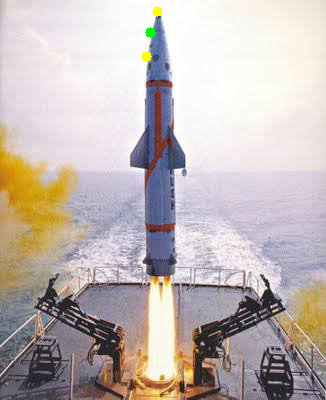

In [ ]:
# Function to find the closest point on a path between two farthest points
def find_closest_point_on_path(points, farthest_point1, farthest_point2):
    midpoint = ((farthest_point1[0] + farthest_point2[0]) / 2, (farthest_point1[1] + farthest_point2[1]) / 2)
    closest_point = None
    min_distance = float('inf')

    for point in points:
        distance = np.linalg.norm(np.array(point) - np.array(midpoint))
        if distance < min_distance:
            min_distance = distance
            closest_point = point

    return closest_point

# Calculate the lengths of the red and blue paths
red_path_length = calculate_path_length(red_points)
blue_path_length = calculate_path_length(blue_points)

# Determine which path is shorter
shorter_path_points = red_points if red_path_length < blue_path_length else blue_points
path_color = (0, 0, 255) if red_path_length < blue_path_length else (255, 0, 0)  # Red or blue color

# Find the farthest points in the shorter path
farthest_point1_shorter_path, farthest_point2_shorter_path = find_farthest_points_in_list(shorter_path_points)

# Find the closest point on the shorter path that is equidistant from the two farthest points
third_point_shorter_path = find_closest_point_on_path(shorter_path_points, farthest_point1_shorter_path, farthest_point2_shorter_path)

# Draw circles around the farthest points and the closest point in the shorter path
cv2.circle(new_im, farthest_point1_shorter_path, 5, (0, 255, 255), -1)  # Yellow circle
cv2.circle(new_im, farthest_point2_shorter_path, 5, (0, 255, 255), -1)  # Yellow circle
cv2.circle(new_im, third_point_shorter_path, 5, (0, 255, 0), -1)  # Green circle

# Print the coordinates of the farthest points and the closest point in the shorter path
print(f"Farthest Point 1 (Shorter Path): {farthest_point1_shorter_path}")
print(f"Farthest Point 2 (Shorter Path): {farthest_point2_shorter_path}")
print(f"Third Point (Closest on Shorter Path): {third_point_shorter_path}")

final_points = [farthest_point1_shorter_path, farthest_point2_shorter_path, third_point_shorter_path]

cv2_imshow(new_im)


In [ ]:
import math

if len(final_points) == 3:
    A = final_points[0]
    B = final_points[1]
    C = final_points[2]

    # Calculate the lengths of sides AB, BC, and CA
    AB = math.sqrt((B[0] - A[0])**2 + (B[1] - A[1])**2)
    BC = math.sqrt((C[0] - B[0])**2 + (C[1] - B[1])**2)
    CA = math.sqrt((A[0] - C[0])**2 + (A[1] - C[1])**2)

    s = (AB + BC + CA) / 2

    # Calculate the area of the triangle using Heron's formula
    area_triangle = math.sqrt(s * (s - AB) * (s - BC) * (s - CA))

    # Calculate the circumradius (R) of the triangle's circumcircle
    circumradius = (AB * BC * CA) / (4 * area_triangle)

    print(f"Circumradius of the triangle: {circumradius}")
else:
    print("Invalid number of points in list l. Need exactly 3 points to calculate the circumradius.")


Circumradius of the triangle: 148.51299980510842


In [ ]:
# Print the dimensions of the image
print("Image dimensions:", new_im.shape[:2])

# Access the mask dimensions from the Instances object
if "pred_masks" in instances.get_fields():
    mask = instances.pred_masks[0].numpy()
    print("Mask dimensions:", mask.shape)
else:
    print("No masks found in the instance predictions.")


Image dimensions: (400, 326)
Mask dimensions: (400, 326)


Enter the real-world length of the missile in meters: 3


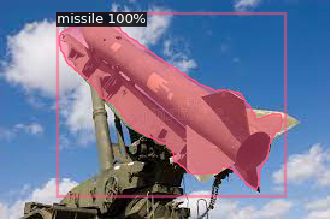

Class: missile
Relative Length of missile Instance: 1.00 units
Real-World Length of missile Instance: 3.00 meters


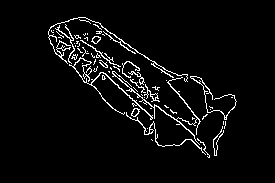

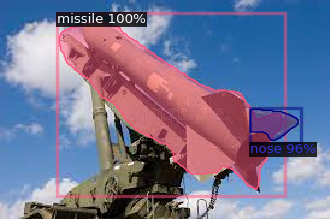

Class: nose
Relative Length of nose Instance: 0.07 units
Real-World Length of nose Instance: 0.20 meters


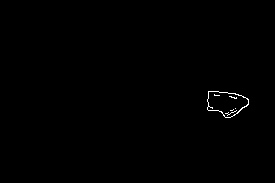

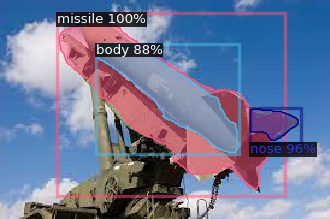

Class: body
Relative Length of body Instance: 0.35 units
Real-World Length of body Instance: 1.05 meters


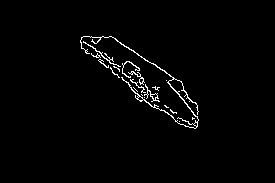

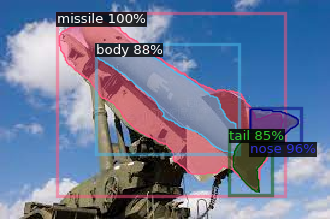

Class: tail
Relative Length of tail Instance: 0.09 units
Real-World Length of tail Instance: 0.26 meters


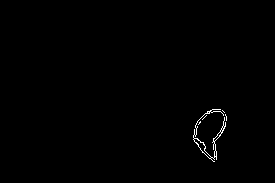

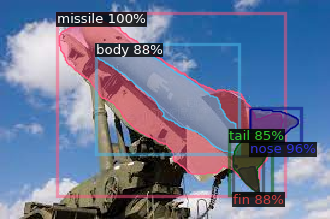

Class: fin
Relative Length of Fin Instance: 0.02 units
Real-World Length of Fin Instance: 0.06 meters


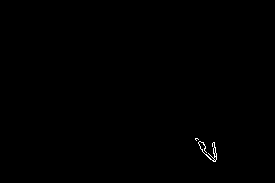

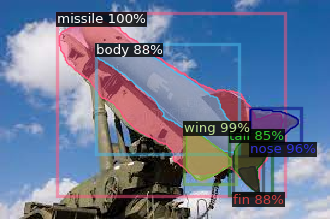

Class: wing
Relative Length of Wing Instance: 0.09 units
Real-World Length of Wing Instance: 0.28 meters


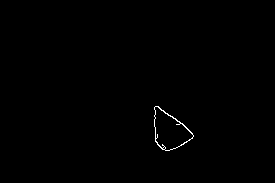

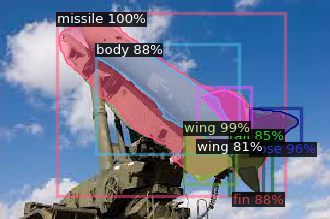

Class: wing
Relative Length of Wing Instance: 0.08 units
Real-World Length of Wing Instance: 0.24 meters


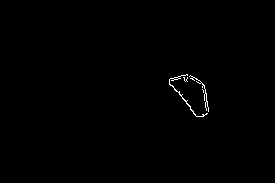

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/drive/MyDrive/10DATA/image2s.jpeg"
new_im = cv2.imread(image_path)

if new_im is None:
    raise ValueError(f"Failed to load image at path: {image_path}")

# Run the predictor
outputs = predictor(new_im)

# Get the instances
instances = outputs["instances"].to("cpu")

# Initialize containers for storing images
output_images = []

# Initialize a dictionary to store the maximum instance for each class and lists for "fin" and "wing"
max_instances = {}
fin_instances = []
wing_instances = []

for i in range(len(instances)):
    pred_class = instances.pred_classes[i].item()
    score = instances.scores[i].item()

    class_name = train_metadata.thing_classes[pred_class]
    if class_name == "fin":
        fin_instances.append(instances[i:i+1])
    elif class_name == "wing":
        wing_instances.append(instances[i:i+1])
    else:
        if pred_class in max_instances:
            if score > max_instances[pred_class]['score']:
                max_instances[pred_class] = {
                    'instance': instances[i:i+1],
                    'score': score,
                    'class_name': class_name
                }
        else:
            max_instances[pred_class] = {
                'instance': instances[i:i+1],
                'score': score,
                'class_name': class_name
            }

# Calculate the total area of instances in the "missile" class
total_missile_area = 0

for instance in max_instances.values():
    pred_class = instance['instance'].pred_classes.item()
    if train_metadata.thing_classes[pred_class] == 'missile':
        masks = instance['instance'].pred_masks.cpu().numpy()
        for mask in masks:
            total_missile_area += np.sum(mask)

# Ask the user for the real-world length of the missile
real_missile_length = float(input("Enter the real-world length of the missile in meters: "))

v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata, scale=1.2)

for key in max_instances:
    max_instance = max_instances[key]['instance']
    class_name = max_instances[key]['class_name']
    out = v.draw_instance_predictions(max_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

    # Extract instance mask
    mask = max_instance.get("pred_masks").cpu().numpy()[0]
    instance_area = np.sum(mask)
    relative_length = instance_area / total_missile_area
    real_world_length = relative_length * real_missile_length

    print(f"Class: {class_name}")
    print(f"Relative Length of {class_name} Instance: {relative_length:.2f} units")
    print(f"Real-World Length of {class_name} Instance: {real_world_length:.2f} meters")

    gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray_image, 100, 200)
    cv2_imshow(edges)

for fin_instance in fin_instances:
    out = v.draw_instance_predictions(fin_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

    mask = fin_instance.get("pred_masks").cpu().numpy()[0]

    instance_area = np.sum(mask)
    relative_length = instance_area / total_missile_area
    real_world_length = relative_length * real_missile_length

    print("Class: fin")
    print(f"Relative Length of Fin Instance: {relative_length:.2f} units")
    print(f"Real-World Length of Fin Instance: {real_world_length:.2f} meters")

    gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray_image, 100, 200)
    cv2_imshow(edges)

for wing_instance in wing_instances:
    out = v.draw_instance_predictions(wing_instance)
    output_image = out.get_image()[:, :, ::-1]
    output_images.append(output_image)
    cv2_imshow(output_image)

    # Extract instance mask
    mask = wing_instance.get("pred_masks").cpu().numpy()[0]
    instance_area = np.sum(mask)
    relative_length = instance_area / total_missile_area
    real_world_length = relative_length * real_missile_length

    print("Class: wing")
    print(f"Relative Length of Wing Instance: {relative_length:.2f} units")
    print(f"Real-World Length of Wing Instance: {real_world_length:.2f} meters")

    gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray_image, 100, 200)
    cv2_imshow(edges)

first_image = output_images[0]
gray_image = cv2.cvtColor(cv2.bitwise_and(new_im, new_im, mask=(mask * 255).astype(np.uint8)), cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray_image, 100, 200)
kernel = np.ones((5, 5), np.uint8)
smooth_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
edges_colored = cv2.cvtColor(smooth_edges, cv2.COLOR_GRAY2BGR)
contours, _ = cv2.findContours(smooth_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)